In [1]:
import torch
import matplotlib.pyplot as plt
import matplotlib
import math
import numpy as np
import random
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from torchvision import transforms
from tqdm import tqdm

import os
import datetime

start_time = datetime.datetime.now() 
print(start_time)

os.environ["KMP_DUPLICATE_LIB_OK"] = "TRUE"

2024-06-15 17:26:52.521081


# Ensure you have a graphics card, otherwise the training time will be excessively long

In [2]:
device = torch.device("cuda:1")
print(torch.cuda.is_available())

True


# Set fixed random seed to ensure reproducible results

In [3]:
def set_seed(seed):
    # --- Set random seed
    random.seed(seed)
    np.random.seed(seed)
    # --- Ensure consistency in hash behavior
    os.environ["PYTHONHASHSEED"] = str(seed)
    # --- Setting the workspace configuration of cuBLAS
    """
    By setting the workspace configuration of cuBLAS, 
    specific workspace sizes and algorithm combinations are ensured when running deep learning models, 
    thereby maintaining consistency of results.
    """
    os.environ["CUBLAS_WORKSPACE_CONFIG"] = ":4096:8"
    # --- Make the random numbers generated on the CPU repeatable
    torch.manual_seed(seed)
    # --- Make the random numbers generated on a single GPU repeatable
    torch.cuda.manual_seed(seed)
    # --- Make the random numbers generated on multiple GPUs repeatable
    torch.cuda.manual_seed_all(seed)
    # --- Using deterministic algorithms ensures consistency and repeatability of calculation results across different runs
    torch.use_deterministic_algorithms(True)
    # --- Set the cuDNN backend to deterministic mode to ensure the use of deterministic algorithms
    """
    Certain operations (such as convolution) produce the same result in multiple runs.
    """
    torch.backends.cudnn.deterministic = True
    # --- Disable cuDNN using non deterministic algorithms
    torch.backends.cudnn.enabled = False
    torch.backends.cudnn.benchmark = False

set_seed(2024)

# Define a function for calculating accuracy

In [4]:
def get_clean_acc(model, data_loader, model_device):
    model.eval()
    correct = 0
    total = 0
    
    for data, labels in data_loader:
        data, labels = data.to(model_device), labels.to(model_device)
        with torch.no_grad():
            logits = model(data)
            prediction = torch.argmax(logits, 1)
            ground_truth = labels
            total += labels.size(0)
            correct += (prediction == ground_truth).sum().item()
            
    accuracy = correct / total
    print(f"Total:{total}  Correct:{correct}  CleanAccuracy:{accuracy:.4f}")
    return accuracy

# Define a function for training the model

In [5]:
def train(model_device,
          model,
          model_optimizer, 
          train_set, validate_set,
          classifier_criterion=nn.CrossEntropyLoss(reduction="mean"),
          epochs=200,
          classes=["0", "1", "2", "3", "4", "5", "6", "7", "8", "9"]
         ):
    train_loss_list = []
    validate_loss_list = []
    best_acc = -np.Inf
    
    # --- Define Scheduler
    scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer=model_optimizer, milestones=[60, 120, 180], last_epoch=0 - 1)
    
    # --- Train
    for epoch in tqdm(range(epochs)):
        train_loss = 0.0
        validate_loss = 0.0
        model.train()
        count = 0
        for dataset_train, dataset_train_labels in train_set:
            count = count + 1
            dataset_train, dataset_train_labels = dataset_train.to(model_device), dataset_train_labels.to(model_device)
            
            logits = model(dataset_train)

            model_optimizer.zero_grad()
            loss = classifier_criterion(logits, dataset_train_labels)
            loss.backward()
            model_optimizer.step()
            
            train_loss += loss.item()
            torch.cuda.empty_cache()
        train_loss_list.append(train_loss / count)
        if scheduler is not None:
            scheduler.step()
        
        # --- Validate
        model.eval()
        count = 0
        for dataset_validate, dataset_validate_labels in validate_set:
            count = count + 1
            dataset_validate, dataset_validate_labels = dataset_validate.to(model_device), dataset_validate_labels.to(model_device)

            with torch.no_grad():
                logits = model(dataset_validate)
            loss = classifier_criterion(logits, dataset_validate_labels)

            validate_loss += loss.item()
            torch.cuda.empty_cache()
        validate_loss_list.append(validate_loss / count)
        
        # --- Show results
        model.eval()
        end_time = datetime.datetime.now()
        time = end_time - start_time
        print(f"Epoch:{epoch}\nTime:{time}\nLoss:{validate_loss / count}")           
        acc = get_clean_acc(model, validate_set, model_device)
        torch.cuda.empty_cache()
        
        # --- Save best model parameters
        if not os.path.exists("./best_params/mnist/vit_tiny"):
            os.makedirs("./best_params/mnist/vit_tiny")
        if acc >= best_acc:
            path = os.path.join("./best_params/mnist/vit_tiny", f"vit_tiny_params_{epoch}.pth")
            #torch.save(model.module.state_dict(), path)
            torch.save(model.state_dict(), path)
            best_acc = acc
       
        # --- Visualize loss
        if epoch != 0:
            fig = plt.figure(figsize=(5, 5))
            x = range(0, len(validate_loss_list))
            y1 = train_loss_list
            y2 = validate_loss_list
            plt.plot(x, y1, label="Train Loss")
            plt.plot(x, y2, label="Validate Loss")
            plt.xlabel("Epoch")
            plt.ylabel("Loss")
            plt.legend()
            if not os.path.exists("./best_params/mnist/vit_tiny/loss_curve"):
                os.makedirs("./best_params/mnist/vit_tiny/loss_curve")
            path = os.path.join("./best_params/mnist/vit_tiny/loss_curve", f"loss_curve_{epoch}.png")
            plt.savefig(path, bbox_inches='tight', dpi=500)
            plt.show()

# Load the dataset

In [6]:
transform_train = transforms.Compose([
    transforms.RandomCrop(28, padding=4, padding_mode="edge"),
    transforms.ToTensor(),
])
transform_test = transforms.Compose([
    transforms.ToTensor(),
])

train_set = torchvision.datasets.MNIST(root="./data",
                                       train=True,
                                       transform=transform_train,
                                       download=True)
train_loader = torch.utils.data.DataLoader(train_set, batch_size=32, shuffle=True, num_workers=1)

test_set = torchvision.datasets.MNIST(root="./data",
                                      train=False,
                                      transform=transform_test,
                                      download=True)
test_loader = torch.utils.data.DataLoader(test_set, batch_size=32, shuffle=False, num_workers=1)
 
print("size=", len(train_loader))
print("size=", len(test_loader))

size= 1875
size= 313


# Load the model

In [7]:
from model_zoo.ViT import ViT_tiny_mnist
net = ViT_tiny_mnist()
net = net.to(device)

# Define Optimizer

In [8]:
optimizer = torch.optim.SGD(params=net.parameters(), lr=0.1, momentum=0.9, weight_decay=5e-4, nesterov=True)

# Begin to train

  0%|                                                                                          | 0/200 [00:00<?, ?it/s]

Epoch:0
Time:0:03:43.693499
Loss:2.3065886101402793


  0%|▍                                                                             | 1/200 [03:52<12:51:23, 232.58s/it]

Total:10000  Correct:1047  CleanAccuracy:0.1047
Epoch:1
Time:0:07:32.739025
Loss:2.3130328137272844
Total:10000  Correct:1135  CleanAccuracy:0.1135


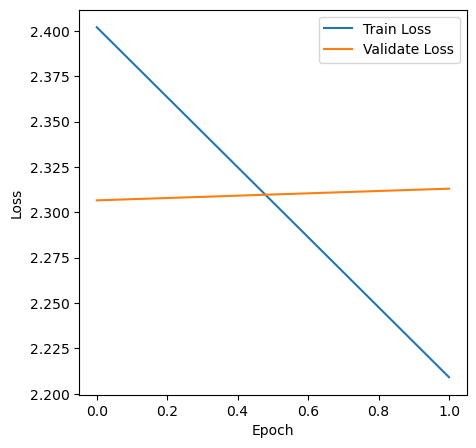

  1%|▊                                                                             | 2/200 [07:42<12:42:03, 230.93s/it]

Epoch:2
Time:0:11:22.017832
Loss:2.0214848270812356
Total:10000  Correct:2316  CleanAccuracy:0.2316


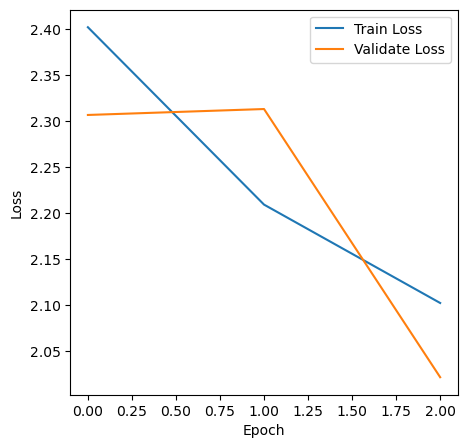

  2%|█▏                                                                            | 3/200 [11:31<12:35:26, 230.09s/it]

Epoch:3
Time:0:15:12.248788
Loss:2.1122755646324767
Total:10000  Correct:2159  CleanAccuracy:0.2159


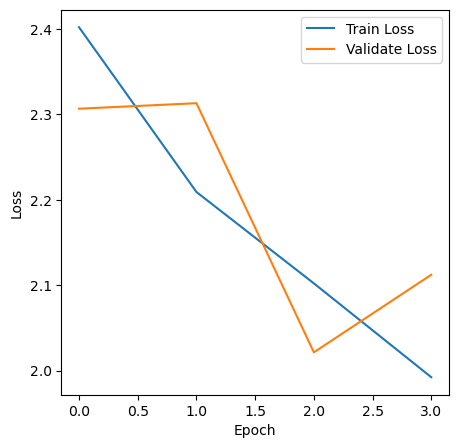

  2%|█▌                                                                            | 4/200 [15:21<12:31:52, 230.16s/it]

Epoch:4
Time:0:19:02.645956
Loss:2.3084056362176475
Total:10000  Correct:1032  CleanAccuracy:0.1032


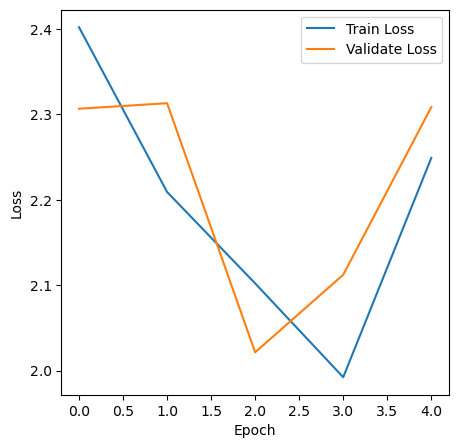

  2%|█▉                                                                            | 5/200 [19:12<12:28:18, 230.25s/it]

Epoch:5
Time:0:22:53.045563
Loss:2.307933319871799
Total:10000  Correct:958  CleanAccuracy:0.0958


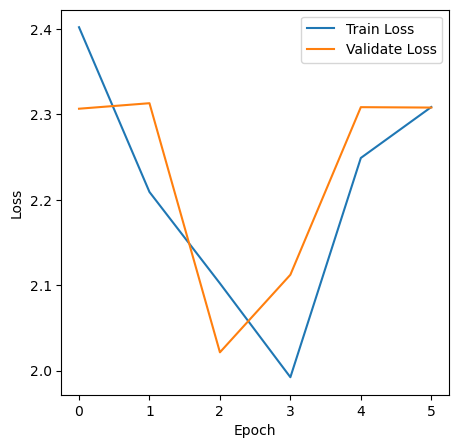

  3%|██▎                                                                           | 6/200 [23:01<12:23:25, 229.93s/it]

Epoch:6
Time:0:26:42.825224
Loss:2.3262807233645892
Total:10000  Correct:892  CleanAccuracy:0.0892


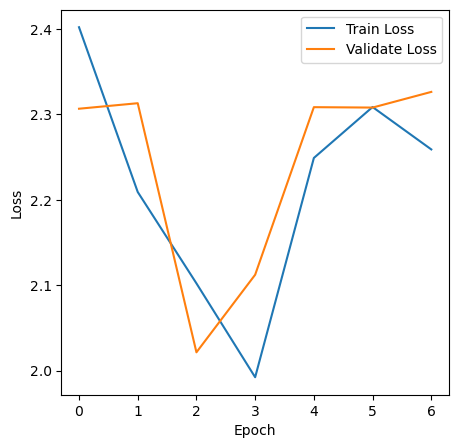

  4%|██▋                                                                           | 7/200 [26:52<12:20:37, 230.25s/it]

Epoch:7
Time:0:30:33.271470
Loss:1.8591155636424836
Total:10000  Correct:2691  CleanAccuracy:0.2691


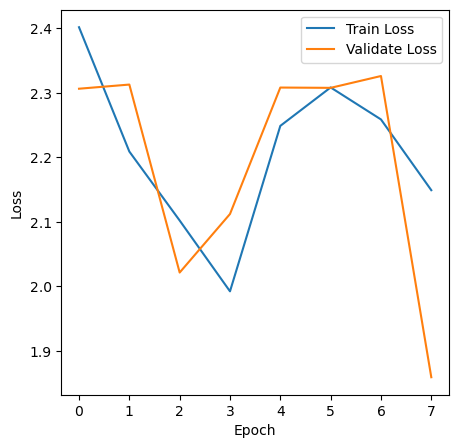

  4%|███                                                                           | 8/200 [30:42<12:17:09, 230.36s/it]

Epoch:8
Time:0:34:24.522946
Loss:2.210675148156504
Total:10000  Correct:1846  CleanAccuracy:0.1846


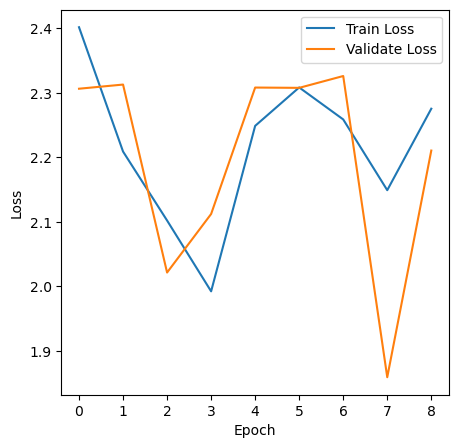

  4%|███▌                                                                          | 9/200 [34:33<12:13:59, 230.57s/it]

Epoch:9
Time:0:38:15.308455
Loss:2.286415499239303
Total:10000  Correct:1295  CleanAccuracy:0.1295


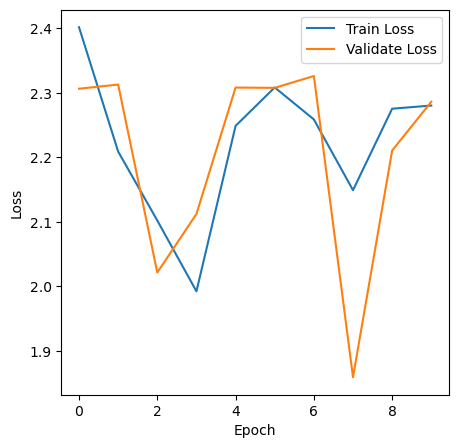

  5%|███▊                                                                         | 10/200 [38:24<12:10:24, 230.65s/it]

Epoch:10
Time:0:42:11.653093
Loss:2.306208387350503
Total:10000  Correct:1307  CleanAccuracy:0.1307


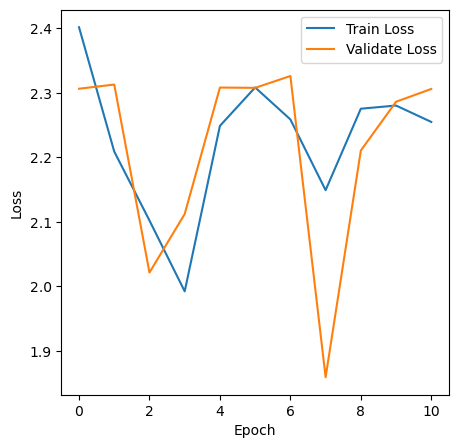

  6%|████▏                                                                        | 11/200 [42:21<12:12:18, 232.48s/it]

Epoch:11
Time:0:46:07.405258
Loss:2.312356468206777
Total:10000  Correct:1135  CleanAccuracy:0.1135


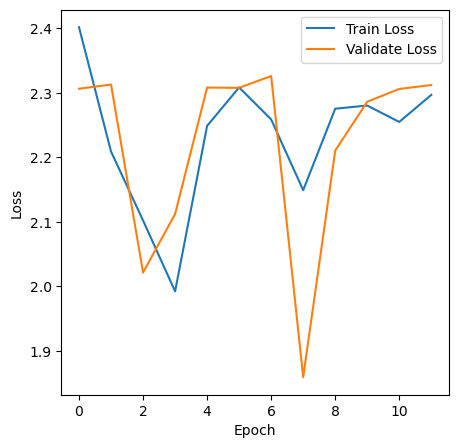

  6%|████▌                                                                        | 12/200 [46:17<12:11:38, 233.50s/it]

Epoch:12
Time:0:50:08.887060
Loss:2.3088297234556547
Total:10000  Correct:982  CleanAccuracy:0.0982


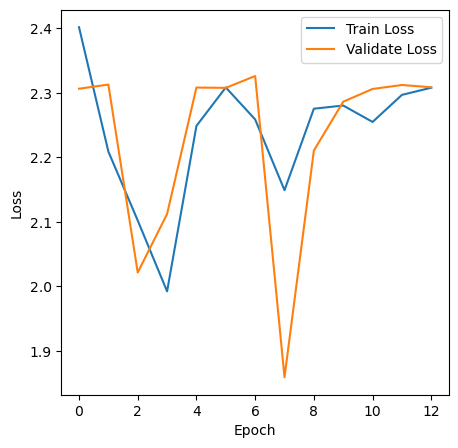

  6%|█████                                                                        | 13/200 [50:18<12:15:17, 235.92s/it]

Epoch:13
Time:0:54:04.626230
Loss:2.3058300003076133
Total:10000  Correct:988  CleanAccuracy:0.0988


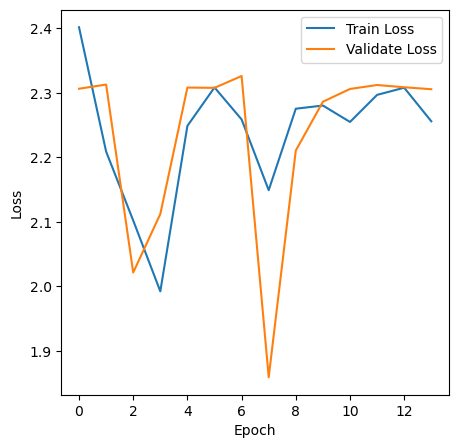

  7%|█████▍                                                                       | 14/200 [54:13<12:10:09, 235.53s/it]

Epoch:14
Time:0:58:00.402985
Loss:2.3273772462107503
Total:10000  Correct:980  CleanAccuracy:0.0980


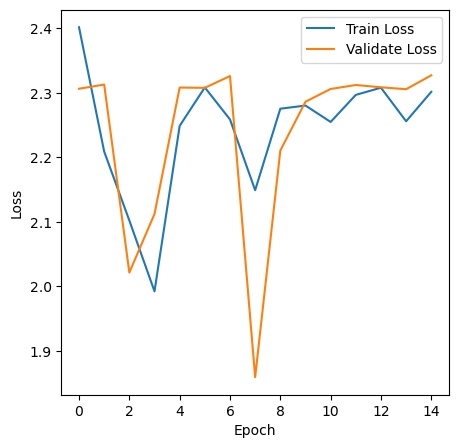

  8%|█████▊                                                                       | 15/200 [58:09<12:06:55, 235.76s/it]

Epoch:15
Time:1:01:56.539531
Loss:2.302860792452535
Total:10000  Correct:980  CleanAccuracy:0.0980


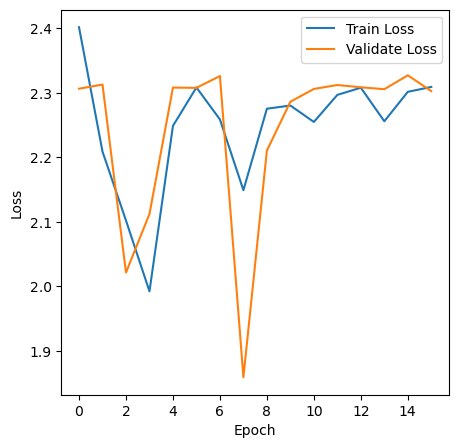

  8%|██████                                                                     | 16/200 [1:02:05<12:03:12, 235.83s/it]

Epoch:16
Time:1:05:52.462110
Loss:2.30313952052936
Total:10000  Correct:1135  CleanAccuracy:0.1135


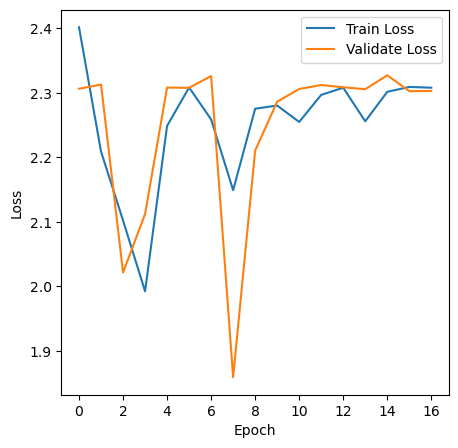

  8%|██████▍                                                                    | 17/200 [1:06:02<12:00:03, 236.08s/it]

Epoch:17
Time:1:09:48.479287
Loss:2.1485041231393054
Total:10000  Correct:1879  CleanAccuracy:0.1879


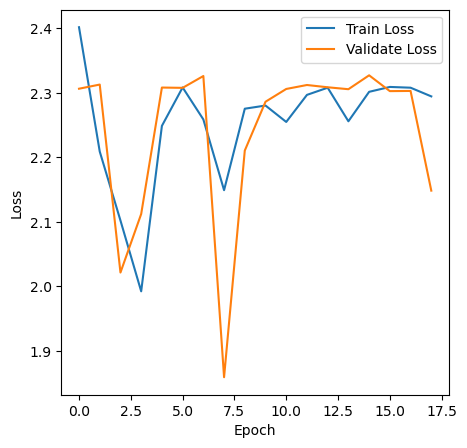

  9%|██████▊                                                                    | 18/200 [1:09:58<11:55:53, 236.01s/it]

Epoch:18
Time:1:13:44.143964
Loss:2.1331753216612452
Total:10000  Correct:1943  CleanAccuracy:0.1943


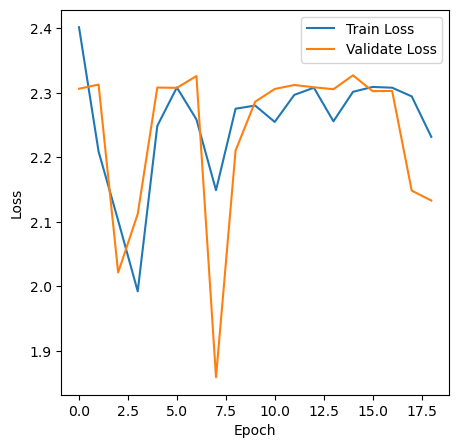

 10%|███████▏                                                                   | 19/200 [1:13:53<11:51:44, 235.93s/it]

Epoch:19
Time:1:17:41.003142
Loss:2.098083617969062
Total:10000  Correct:1889  CleanAccuracy:0.1889


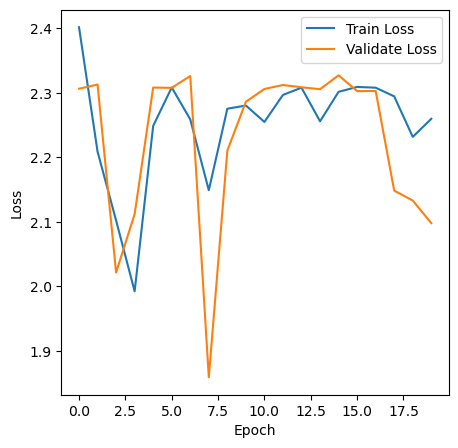

 10%|███████▌                                                                   | 20/200 [1:17:50<11:48:38, 236.21s/it]

Epoch:20
Time:1:21:40.119439
Loss:2.3245417789910165
Total:10000  Correct:979  CleanAccuracy:0.0979


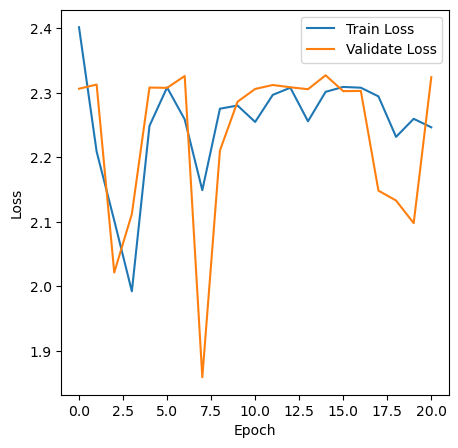

 10%|███████▉                                                                   | 21/200 [1:21:50<11:47:41, 237.21s/it]

Epoch:21
Time:1:25:37.258239
Loss:2.308733457193588
Total:10000  Correct:958  CleanAccuracy:0.0958


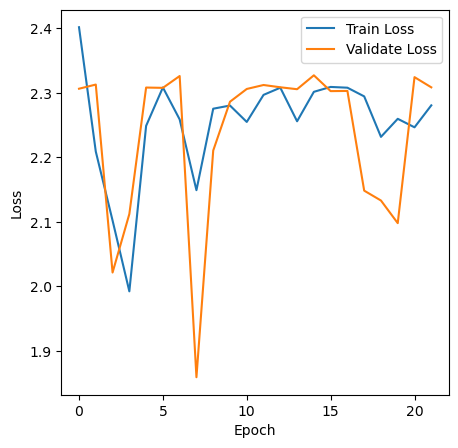

 11%|████████▎                                                                  | 22/200 [1:25:46<11:43:04, 236.99s/it]

Epoch:22
Time:1:29:32.560180
Loss:2.3090883108754507
Total:10000  Correct:1009  CleanAccuracy:0.1009


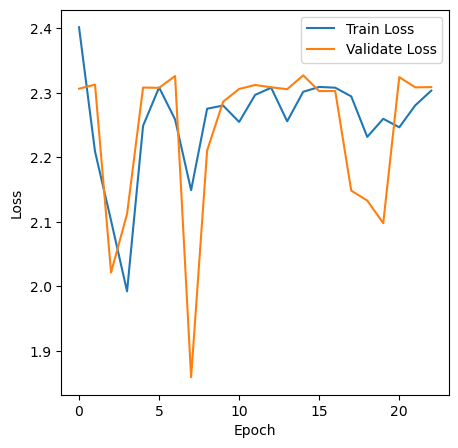

 12%|████████▋                                                                  | 23/200 [1:29:42<11:37:48, 236.54s/it]

Epoch:23
Time:1:33:29.071657
Loss:2.2053527801562423
Total:10000  Correct:2132  CleanAccuracy:0.2132


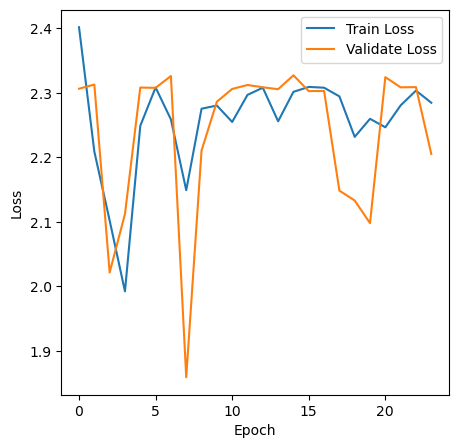

 12%|█████████                                                                  | 24/200 [1:33:38<11:33:35, 236.45s/it]

Epoch:24
Time:1:37:24.505937
Loss:2.0208946028456523
Total:10000  Correct:2361  CleanAccuracy:0.2361


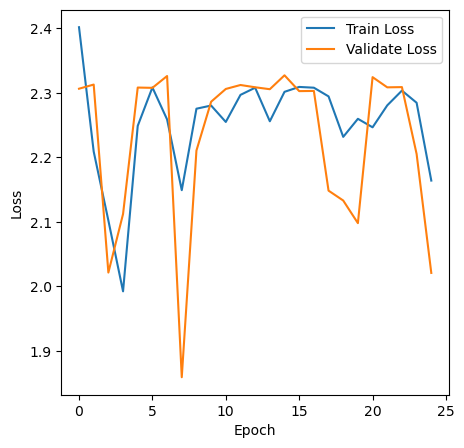

 12%|█████████▍                                                                 | 25/200 [1:37:34<11:28:56, 236.21s/it]

Epoch:25
Time:1:41:20.879784
Loss:2.168498184353399
Total:10000  Correct:1837  CleanAccuracy:0.1837


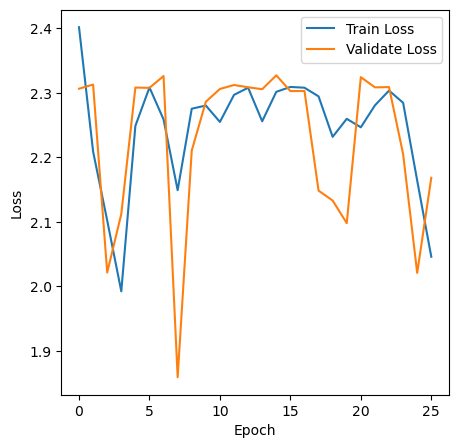

 13%|█████████▊                                                                 | 26/200 [1:41:30<11:25:10, 236.27s/it]

Epoch:26
Time:1:45:16.348044
Loss:1.8803383332852739
Total:10000  Correct:2903  CleanAccuracy:0.2903


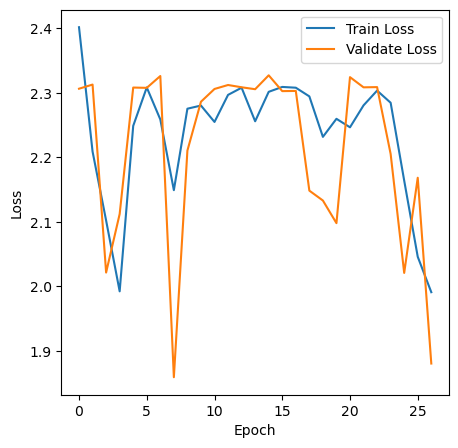

 14%|██████████▏                                                                | 27/200 [1:45:25<11:20:27, 236.00s/it]

Epoch:27
Time:1:49:13.373208
Loss:1.9575883222464174
Total:10000  Correct:2444  CleanAccuracy:0.2444


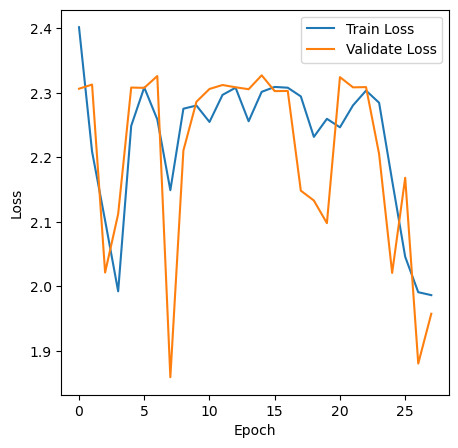

 14%|██████████▌                                                                | 28/200 [1:49:22<11:16:35, 236.02s/it]

Epoch:28
Time:1:53:07.370269
Loss:2.3024257851865726
Total:10000  Correct:1188  CleanAccuracy:0.1188


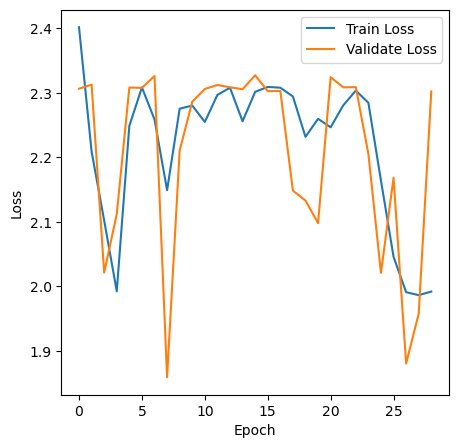

 14%|██████████▉                                                                | 29/200 [1:53:16<11:10:57, 235.42s/it]

Epoch:29
Time:1:57:03.078875
Loss:1.8931939799945576
Total:10000  Correct:2729  CleanAccuracy:0.2729


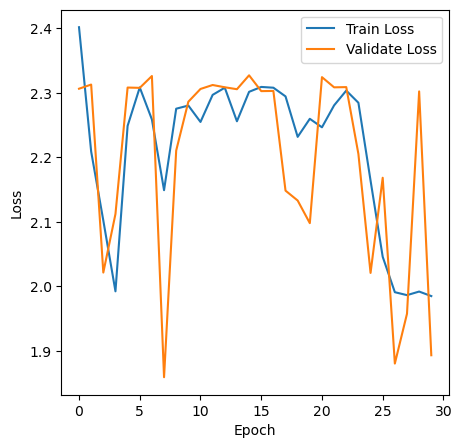

 15%|███████████▎                                                               | 30/200 [1:57:11<11:07:15, 235.51s/it]

Epoch:30
Time:2:00:58.135432
Loss:1.8461948096180876
Total:10000  Correct:3050  CleanAccuracy:0.3050


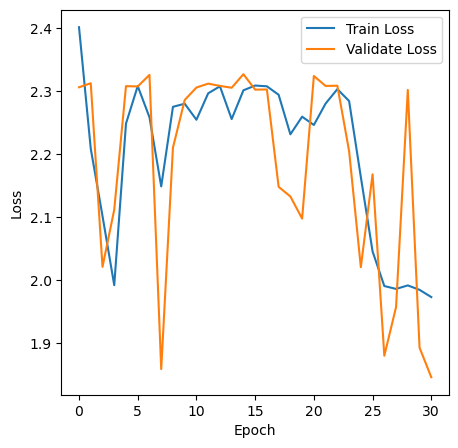

 16%|███████████▋                                                               | 31/200 [2:01:07<11:03:50, 235.68s/it]

Epoch:31
Time:2:04:59.620474
Loss:1.818139706175929
Total:10000  Correct:3080  CleanAccuracy:0.3080


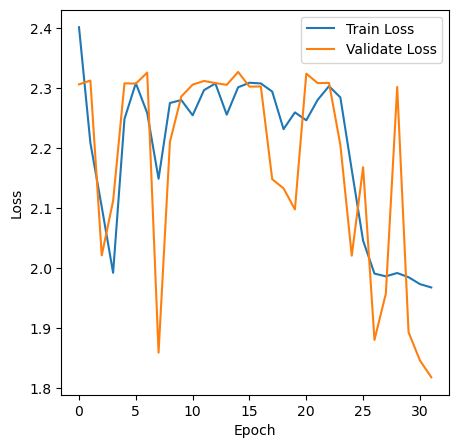

 16%|████████████                                                               | 32/200 [2:05:09<11:04:38, 237.37s/it]

Epoch:32
Time:2:08:55.461597
Loss:1.630095647546811
Total:10000  Correct:3878  CleanAccuracy:0.3878


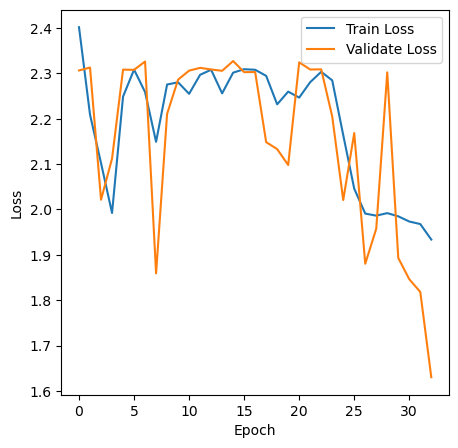

 16%|████████████▍                                                              | 33/200 [2:09:05<10:59:29, 236.95s/it]

Epoch:33
Time:2:12:51.576284
Loss:1.7853539035723993
Total:10000  Correct:3054  CleanAccuracy:0.3054


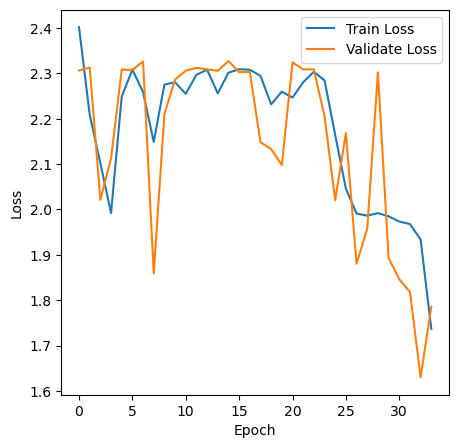

 17%|████████████▊                                                              | 34/200 [2:13:00<10:54:08, 236.44s/it]

Epoch:34
Time:2:16:47.708232
Loss:1.5582243969646126
Total:10000  Correct:4136  CleanAccuracy:0.4136


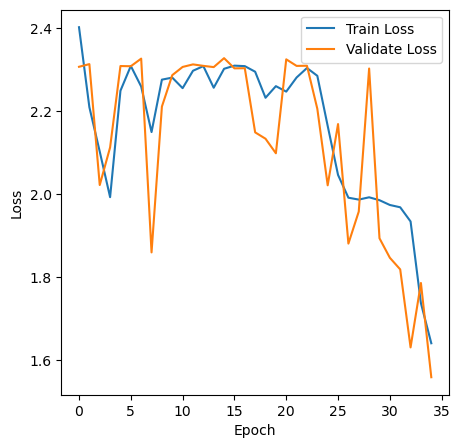

 18%|█████████████▏                                                             | 35/200 [2:16:57<10:50:37, 236.59s/it]

Epoch:35
Time:2:20:43.743585
Loss:1.2153797446729275
Total:10000  Correct:5555  CleanAccuracy:0.5555


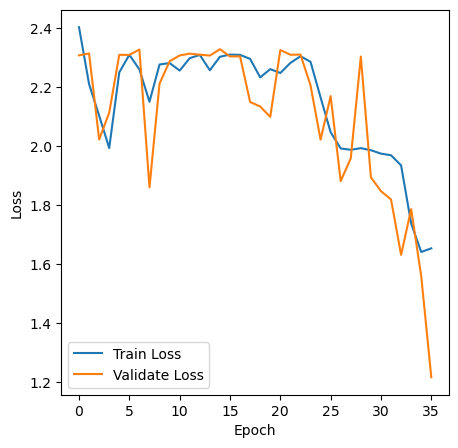

 18%|█████████████▌                                                             | 36/200 [2:20:53<10:46:20, 236.47s/it]

Epoch:36
Time:2:24:39.435596
Loss:1.213779507544094
Total:10000  Correct:5756  CleanAccuracy:0.5756


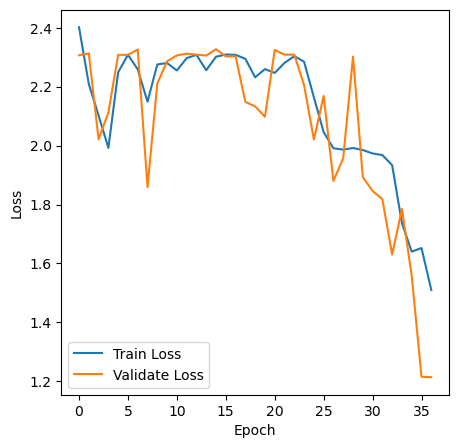

 18%|█████████████▉                                                             | 37/200 [2:24:49<10:41:44, 236.23s/it]

Epoch:37
Time:2:28:35.765319
Loss:1.0928521645716585
Total:10000  Correct:6141  CleanAccuracy:0.6141


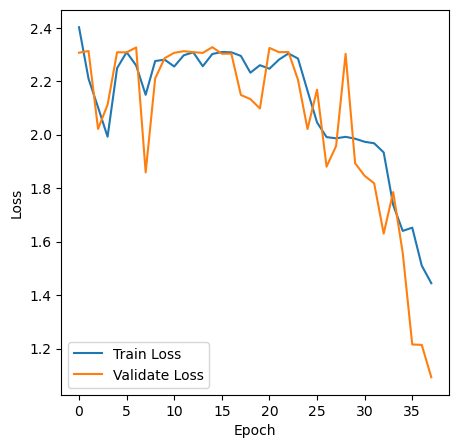

 19%|██████████████▎                                                            | 38/200 [2:28:45<10:37:48, 236.23s/it]

Epoch:38
Time:2:32:31.704183
Loss:0.8475856283983103
Total:10000  Correct:7236  CleanAccuracy:0.7236


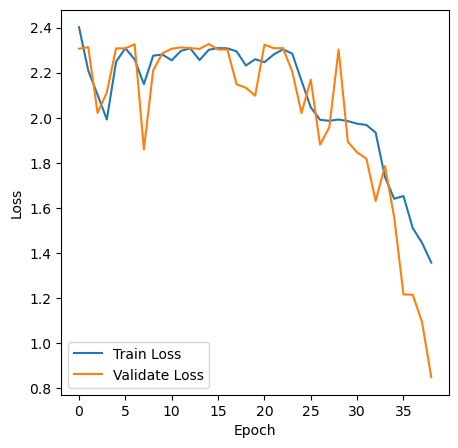

 20%|██████████████▋                                                            | 39/200 [2:32:41<10:33:38, 236.14s/it]

Epoch:39
Time:2:36:28.489818
Loss:0.9981563832051457
Total:10000  Correct:6782  CleanAccuracy:0.6782


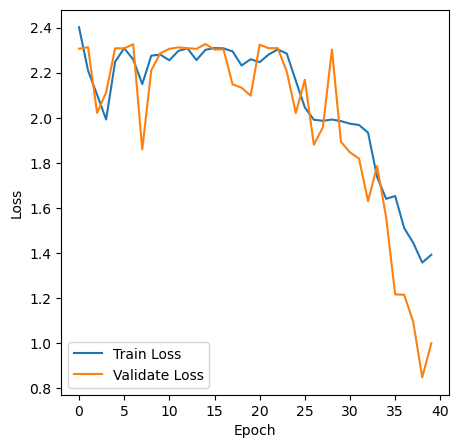

 20%|███████████████                                                            | 40/200 [2:36:38<10:30:14, 236.34s/it]

Epoch:40
Time:2:40:24.514159
Loss:1.3544834031464574
Total:10000  Correct:5153  CleanAccuracy:0.5153


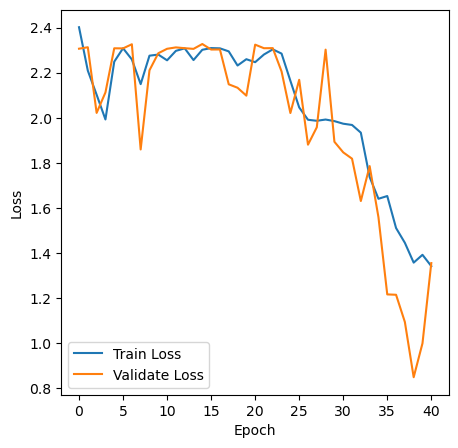

 20%|███████████████▎                                                           | 41/200 [2:40:34<10:26:00, 236.23s/it]

Epoch:41
Time:2:44:20.453042
Loss:2.0224423736048203
Total:10000  Correct:2450  CleanAccuracy:0.2450


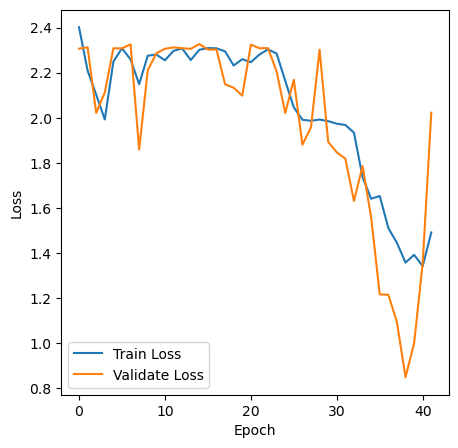

 21%|███████████████▊                                                           | 42/200 [2:44:29<10:21:42, 236.09s/it]

Epoch:42
Time:2:48:16.505483
Loss:1.6027386576984637
Total:10000  Correct:4193  CleanAccuracy:0.4193


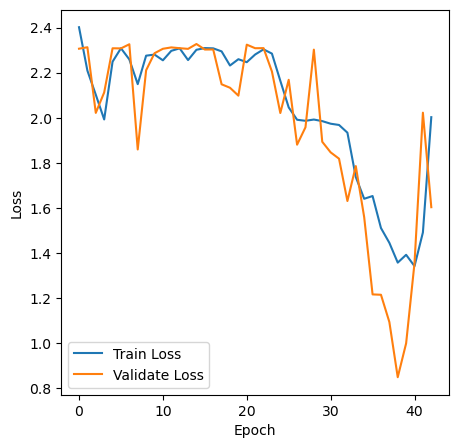

 22%|████████████████▏                                                          | 43/200 [2:48:26<10:18:00, 236.18s/it]

Epoch:43
Time:2:52:14.573390
Loss:1.1851737588739242
Total:10000  Correct:5826  CleanAccuracy:0.5826


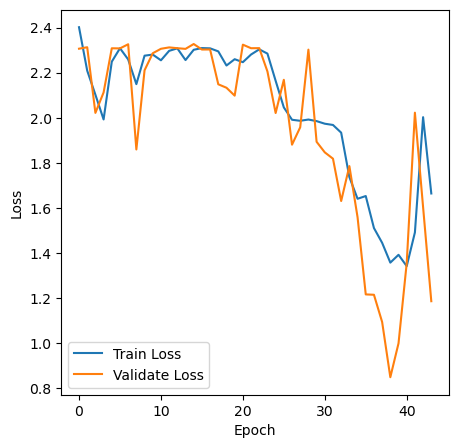

 22%|████████████████▌                                                          | 44/200 [2:52:24<10:15:28, 236.72s/it]

Epoch:44
Time:2:56:11.418849
Loss:2.1825247393629423
Total:10000  Correct:1792  CleanAccuracy:0.1792


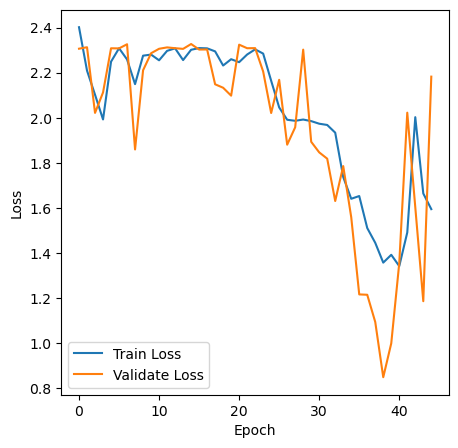

 22%|████████████████▉                                                          | 45/200 [2:56:21<10:11:34, 236.74s/it]

Epoch:45
Time:3:00:07.547291
Loss:2.143470435477674
Total:10000  Correct:1872  CleanAccuracy:0.1872


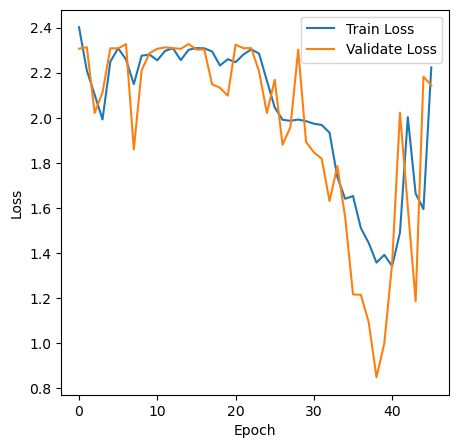

 23%|█████████████████▎                                                         | 46/200 [3:00:16<10:06:32, 236.32s/it]

Epoch:46
Time:3:04:02.951450
Loss:2.3068059206770632
Total:10000  Correct:1069  CleanAccuracy:0.1069


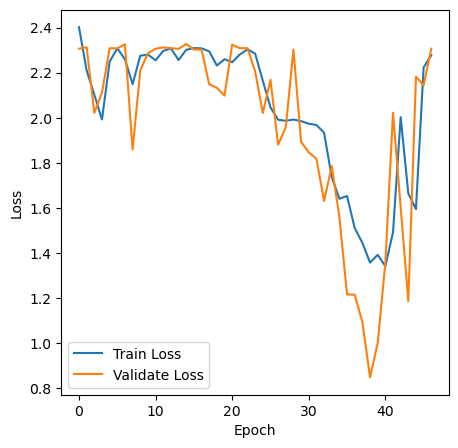

 24%|█████████████████▋                                                         | 47/200 [3:04:11<10:01:58, 236.07s/it]

Epoch:47
Time:3:07:58.438913
Loss:2.3193122137087983
Total:10000  Correct:1135  CleanAccuracy:0.1135


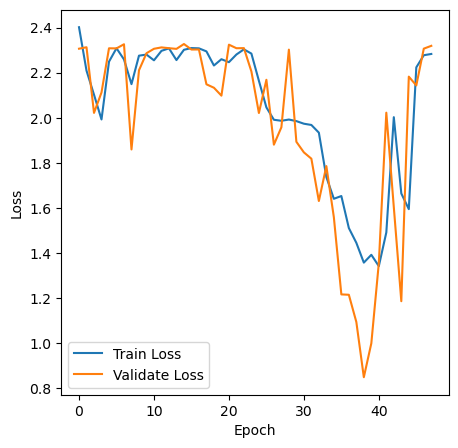

 24%|██████████████████▏                                                         | 48/200 [3:08:07<9:57:37, 235.90s/it]

Epoch:48
Time:3:11:54.460380
Loss:2.055653974271049
Total:10000  Correct:2122  CleanAccuracy:0.2122


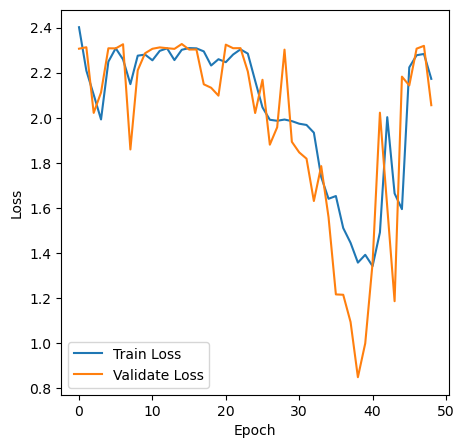

 24%|██████████████████▌                                                         | 49/200 [3:12:04<9:54:23, 236.18s/it]

Epoch:49
Time:3:15:50.390196
Loss:2.0246017908516785
Total:10000  Correct:2462  CleanAccuracy:0.2462


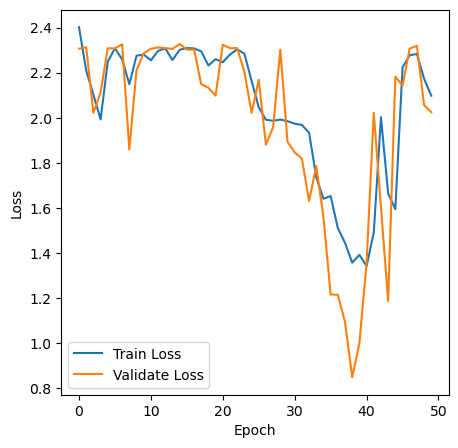

 25%|███████████████████                                                         | 50/200 [3:15:59<9:50:05, 236.04s/it]

Epoch:50
Time:3:19:46.417513
Loss:1.54092104175982
Total:10000  Correct:3868  CleanAccuracy:0.3868


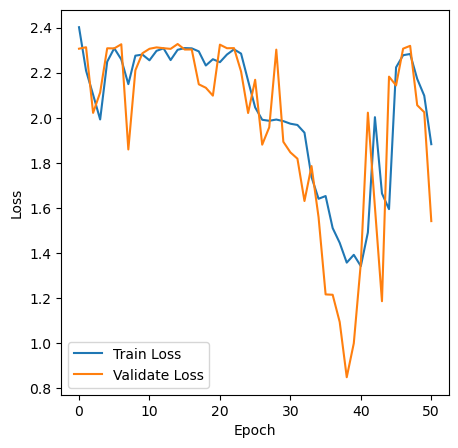

 26%|███████████████████▍                                                        | 51/200 [3:19:56<9:46:13, 236.07s/it]

Epoch:51
Time:3:23:42.662593
Loss:1.3319878145909538
Total:10000  Correct:4948  CleanAccuracy:0.4948


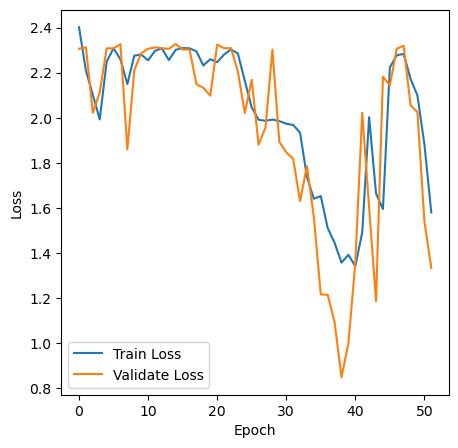

 26%|███████████████████▊                                                        | 52/200 [3:23:52<9:42:23, 236.10s/it]

Epoch:52
Time:3:27:37.496213
Loss:2.098412817278609
Total:10000  Correct:2345  CleanAccuracy:0.2345


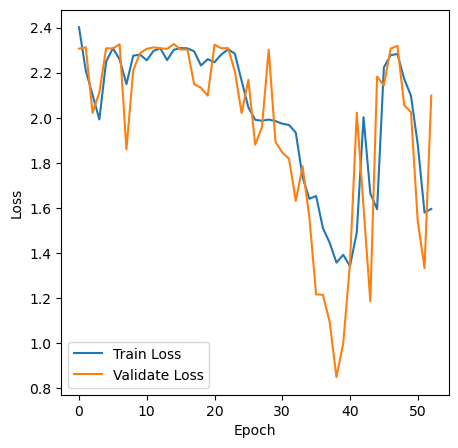

 26%|████████████████████▏                                                       | 53/200 [3:27:47<9:37:37, 235.77s/it]

Epoch:53
Time:3:31:48.164592
Loss:2.171560942555388
Total:10000  Correct:1860  CleanAccuracy:0.1860


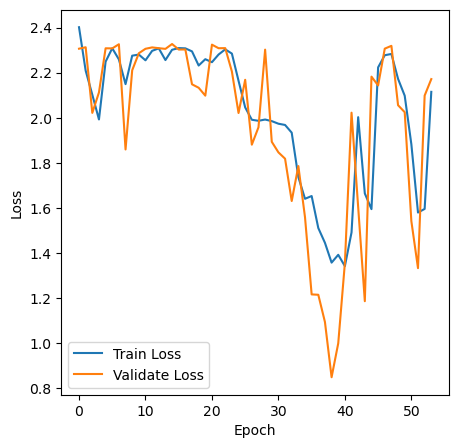

 27%|████████████████████▌                                                       | 54/200 [3:31:57<9:44:38, 240.27s/it]

Epoch:54
Time:3:35:45.125036
Loss:2.328707637116551
Total:10000  Correct:1027  CleanAccuracy:0.1027


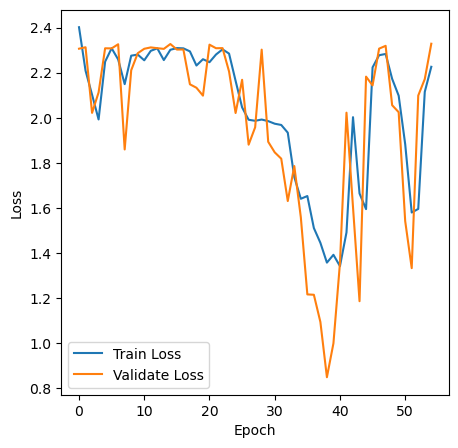

 28%|████████████████████▉                                                       | 55/200 [3:35:54<9:38:12, 239.26s/it]

Epoch:55
Time:3:39:46.344667
Loss:2.3076950026015504
Total:10000  Correct:1133  CleanAccuracy:0.1133


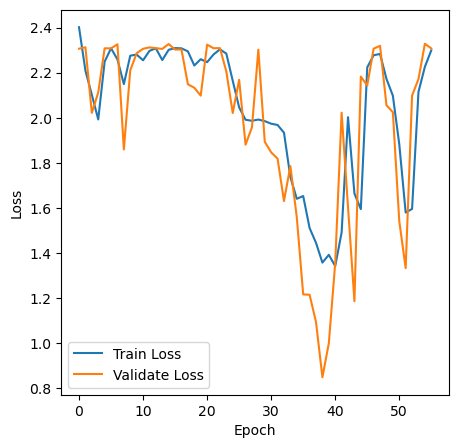

 28%|█████████████████████▎                                                      | 56/200 [3:39:55<9:35:25, 239.76s/it]

Epoch:56
Time:3:43:42.453083
Loss:2.3037230450505266
Total:10000  Correct:1028  CleanAccuracy:0.1028


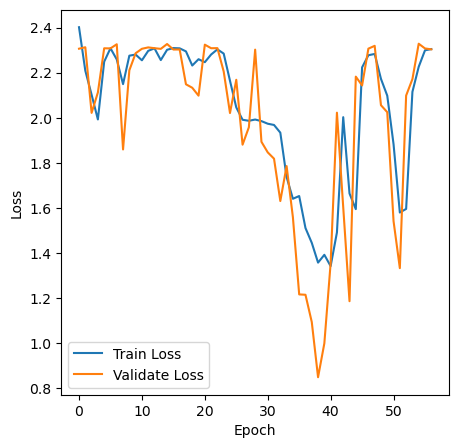

 28%|█████████████████████▋                                                      | 57/200 [3:43:51<9:28:49, 238.67s/it]

Epoch:57
Time:3:47:39.417288
Loss:2.3042457050408798
Total:10000  Correct:980  CleanAccuracy:0.0980


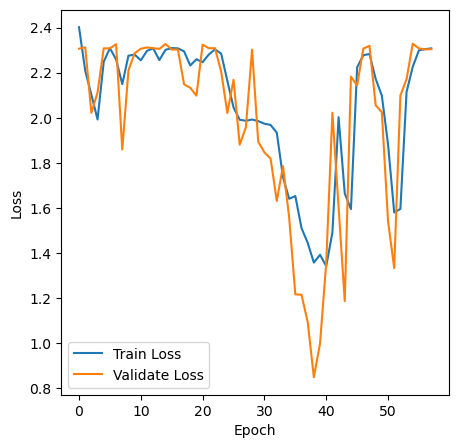

 29%|██████████████████████                                                      | 58/200 [3:47:48<9:23:40, 238.17s/it]

Epoch:58
Time:3:51:59.177218
Loss:2.3094330374806074
Total:10000  Correct:958  CleanAccuracy:0.0958


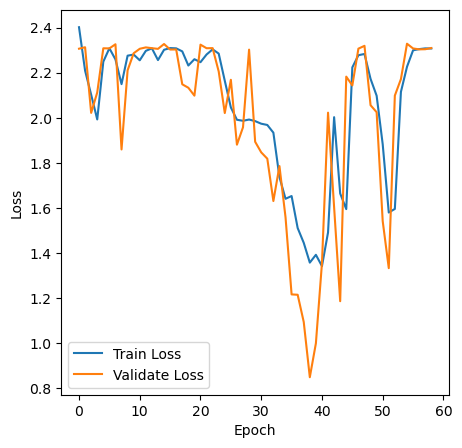

 30%|██████████████████████▍                                                     | 59/200 [3:52:09<9:35:22, 244.84s/it]

Epoch:59
Time:3:56:09.772570
Loss:2.3139312084490498
Total:10000  Correct:1010  CleanAccuracy:0.1010


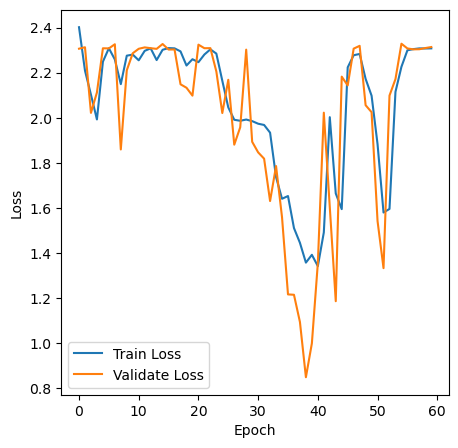

 30%|██████████████████████▊                                                     | 60/200 [3:56:18<9:34:08, 246.06s/it]

Epoch:60
Time:4:00:04.913309
Loss:2.3016802769499467
Total:10000  Correct:1135  CleanAccuracy:0.1135


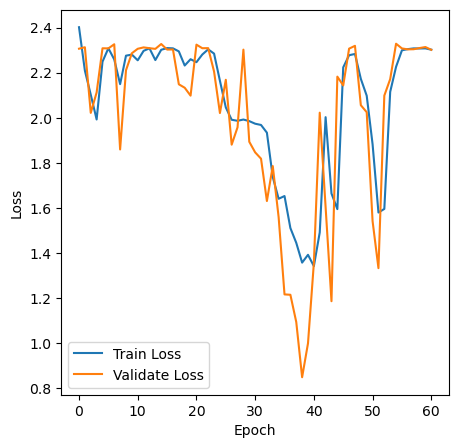

 30%|███████████████████████▏                                                    | 61/200 [4:00:13<9:22:51, 242.96s/it]

Epoch:61
Time:4:04:00.669271
Loss:2.3013837916401627
Total:10000  Correct:1135  CleanAccuracy:0.1135


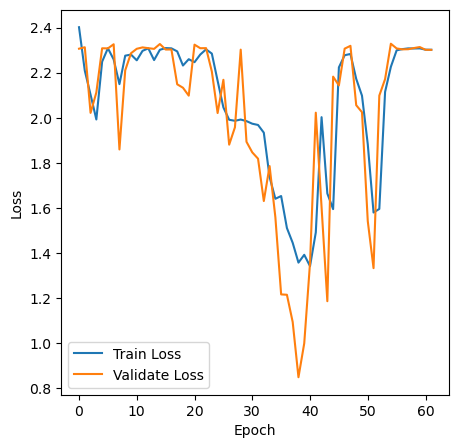

 31%|███████████████████████▌                                                    | 62/200 [4:04:09<9:13:38, 240.71s/it]

Epoch:62
Time:4:07:57.030176
Loss:1.892806420691859
Total:10000  Correct:2669  CleanAccuracy:0.2669


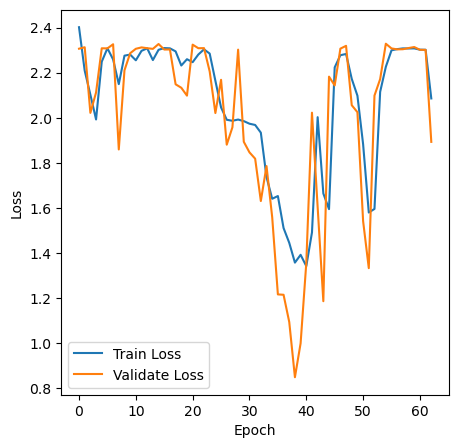

 32%|███████████████████████▉                                                    | 63/200 [4:08:06<9:07:16, 239.68s/it]

Epoch:63
Time:4:11:54.564541
Loss:1.7876361528524576
Total:10000  Correct:2844  CleanAccuracy:0.2844


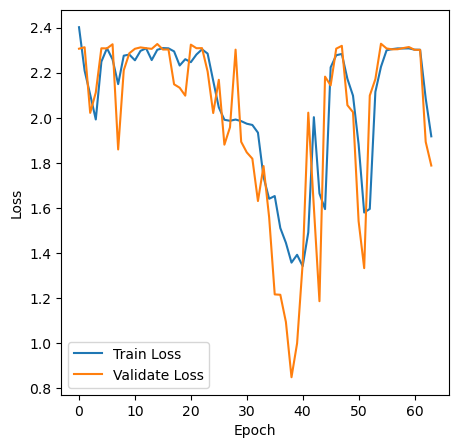

 32%|████████████████████████▎                                                   | 64/200 [4:12:04<9:01:49, 239.04s/it]

Epoch:64
Time:4:15:51.769901
Loss:1.8134198474427001
Total:10000  Correct:2736  CleanAccuracy:0.2736


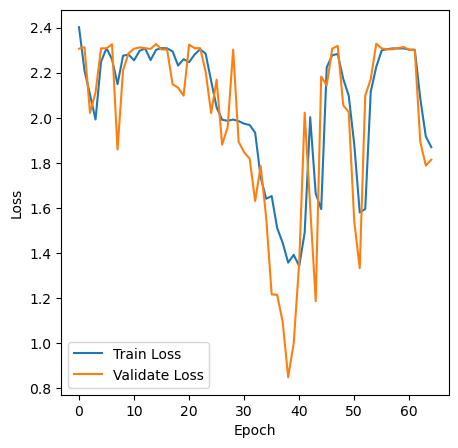

 32%|████████████████████████▋                                                   | 65/200 [4:16:01<8:56:36, 238.50s/it]

Epoch:65
Time:4:19:48.802261
Loss:1.7675132183982922
Total:10000  Correct:3027  CleanAccuracy:0.3027


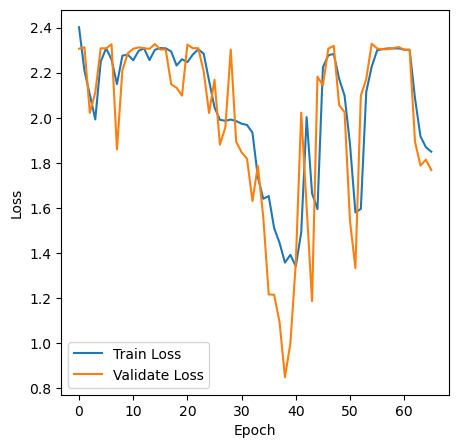

 33%|█████████████████████████                                                   | 66/200 [4:19:58<8:51:41, 238.07s/it]

Epoch:66
Time:4:23:46.203222
Loss:1.6596283459434875
Total:10000  Correct:3707  CleanAccuracy:0.3707


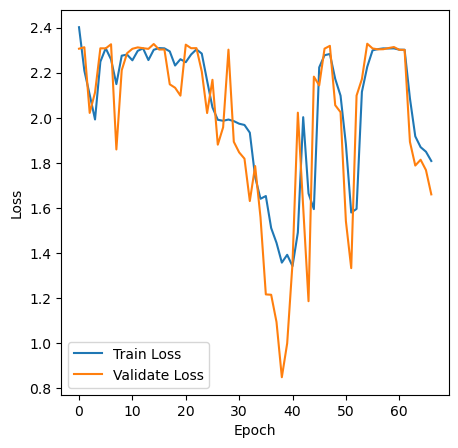

 34%|█████████████████████████▍                                                  | 67/200 [4:23:55<8:47:14, 237.86s/it]

Epoch:67
Time:4:27:42.695078
Loss:1.6799515523849584
Total:10000  Correct:3486  CleanAccuracy:0.3486


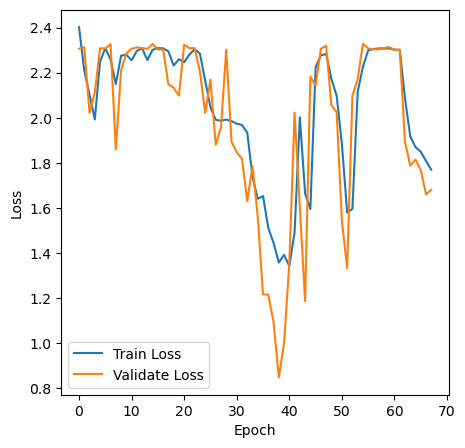

 34%|█████████████████████████▊                                                  | 68/200 [4:27:52<8:42:23, 237.45s/it]

Epoch:68
Time:4:31:40.212895
Loss:1.4429279367763774
Total:10000  Correct:4783  CleanAccuracy:0.4783


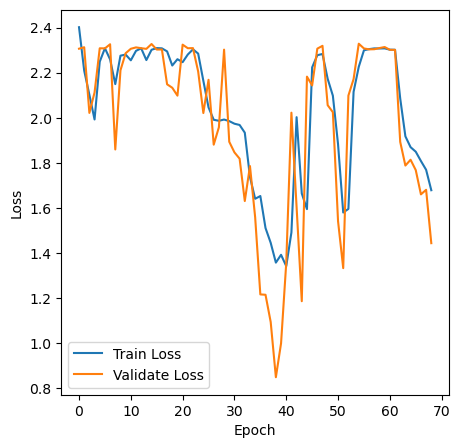

 34%|██████████████████████████▏                                                 | 69/200 [4:31:49<8:38:26, 237.45s/it]

Epoch:69
Time:4:35:37.113721
Loss:1.3510594061388375
Total:10000  Correct:4848  CleanAccuracy:0.4848


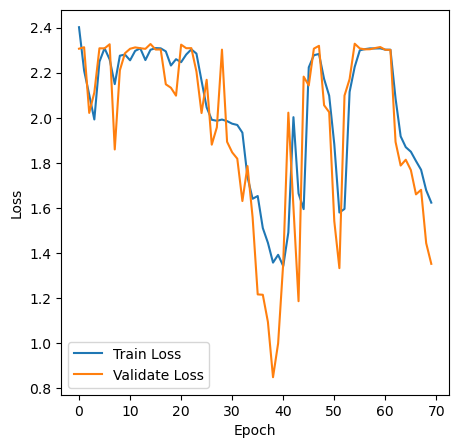

 35%|██████████████████████████▌                                                 | 70/200 [4:35:46<8:34:09, 237.31s/it]

Epoch:70
Time:4:39:34.776275
Loss:1.234971093293577
Total:10000  Correct:5456  CleanAccuracy:0.5456


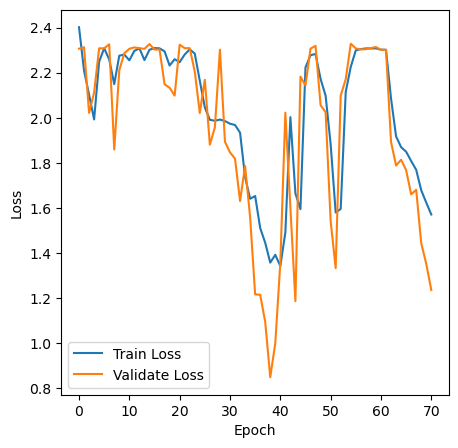

 36%|██████████████████████████▉                                                 | 71/200 [4:39:44<8:30:20, 237.37s/it]

Epoch:71
Time:4:43:31.103540
Loss:1.2129994114747824
Total:10000  Correct:5325  CleanAccuracy:0.5325


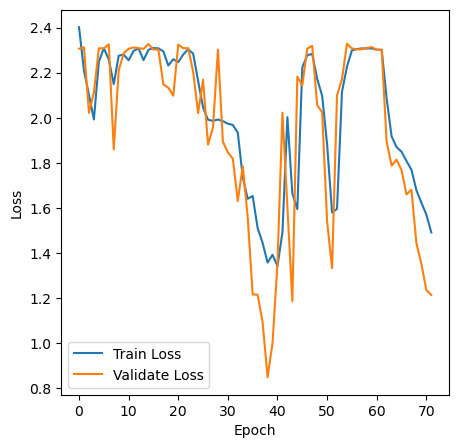

 36%|███████████████████████████▎                                                | 72/200 [4:43:40<8:25:50, 237.12s/it]

Epoch:72
Time:4:47:27.675425
Loss:1.169075372310492
Total:10000  Correct:5630  CleanAccuracy:0.5630


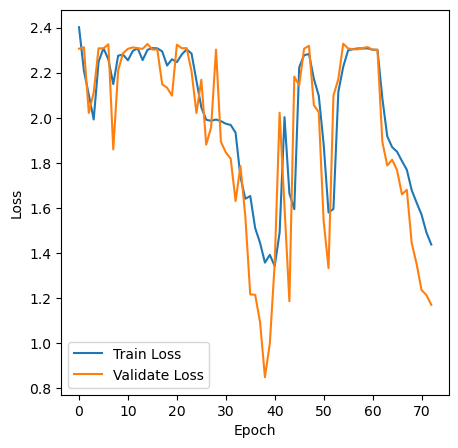

 36%|███████████████████████████▋                                                | 73/200 [4:47:37<8:21:33, 236.96s/it]

Epoch:73
Time:4:51:25.360332
Loss:1.1210935658540209
Total:10000  Correct:5860  CleanAccuracy:0.5860


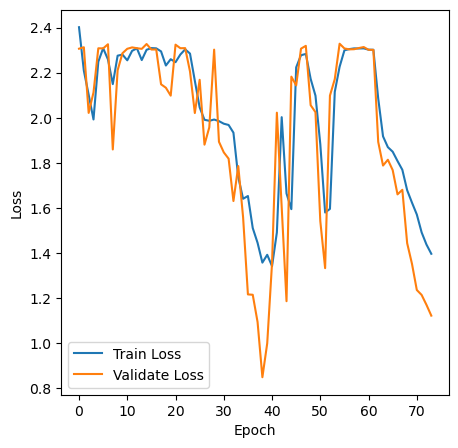

 37%|████████████████████████████                                                | 74/200 [4:51:35<8:18:02, 237.16s/it]

Epoch:74
Time:4:55:22.459264
Loss:1.061953689153202
Total:10000  Correct:6031  CleanAccuracy:0.6031


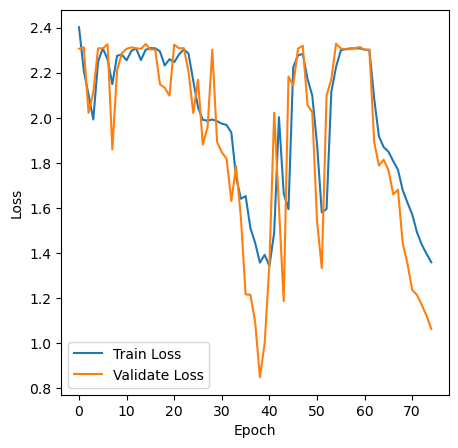

 38%|████████████████████████████▌                                               | 75/200 [4:55:32<8:13:58, 237.11s/it]

Epoch:75
Time:4:59:19.181101
Loss:0.9375834442175235
Total:10000  Correct:6729  CleanAccuracy:0.6729


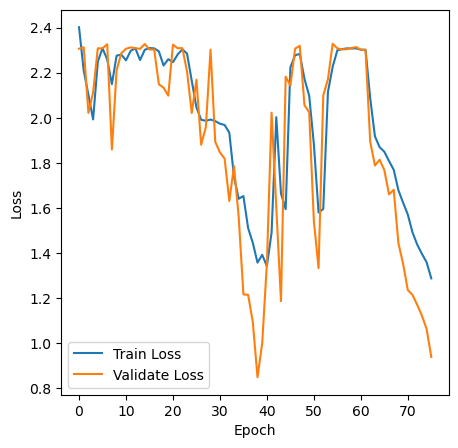

 38%|████████████████████████████▉                                               | 76/200 [4:59:28<8:09:46, 236.99s/it]

Epoch:76
Time:5:03:09.926199
Loss:0.8242779688332409
Total:10000  Correct:7224  CleanAccuracy:0.7224


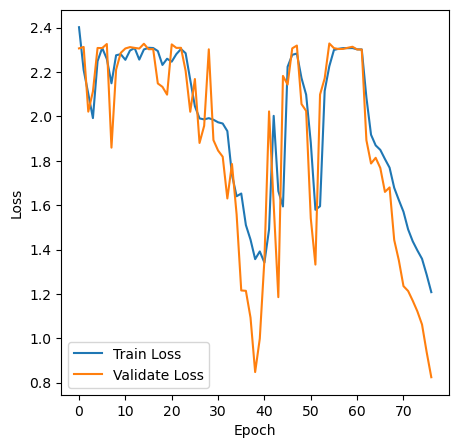

 38%|█████████████████████████████▎                                              | 77/200 [5:03:19<8:01:54, 235.08s/it]

Epoch:77
Time:5:07:00.229435
Loss:0.8200228919807714
Total:10000  Correct:7182  CleanAccuracy:0.7182


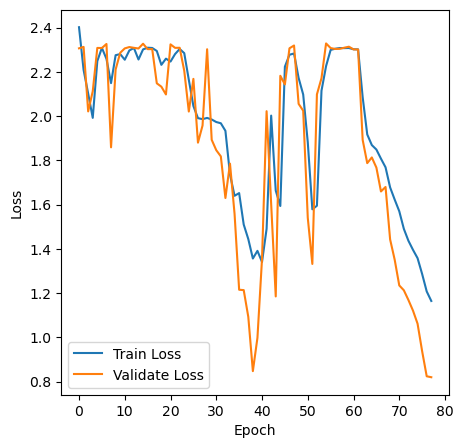

 39%|█████████████████████████████▋                                              | 78/200 [5:07:09<7:55:07, 233.67s/it]

Epoch:78
Time:5:10:50.029875
Loss:0.8683667912269933
Total:10000  Correct:6992  CleanAccuracy:0.6992


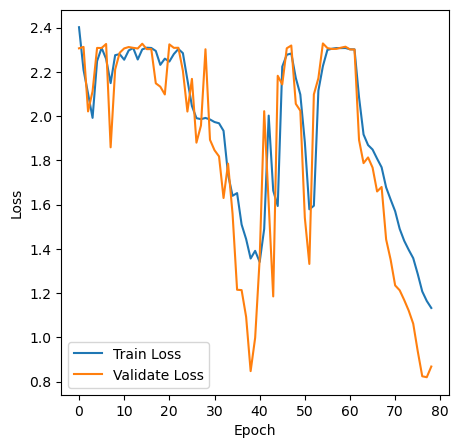

 40%|██████████████████████████████                                              | 79/200 [5:10:58<7:48:27, 232.29s/it]

Epoch:79
Time:5:14:39.283415
Loss:0.7201321161212251
Total:10000  Correct:7541  CleanAccuracy:0.7541


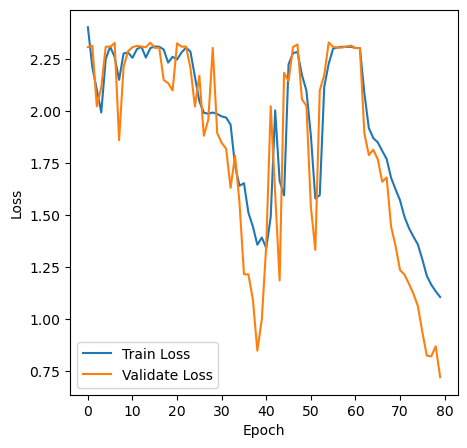

 40%|██████████████████████████████▍                                             | 80/200 [5:14:47<7:42:38, 231.32s/it]

Epoch:80
Time:5:18:29.891353
Loss:1.0006740460761439
Total:10000  Correct:6503  CleanAccuracy:0.6503


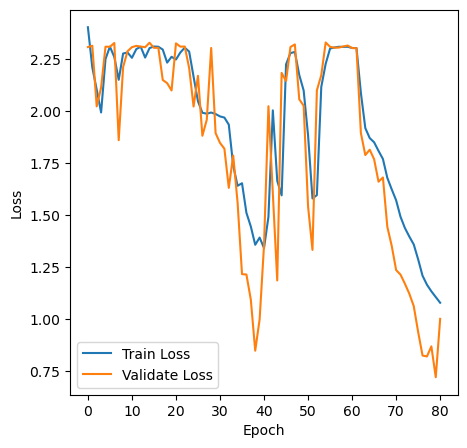

 40%|██████████████████████████████▊                                             | 81/200 [5:18:38<7:38:23, 231.12s/it]

Epoch:81
Time:5:22:19.239926
Loss:0.8254228915078953
Total:10000  Correct:7165  CleanAccuracy:0.7165


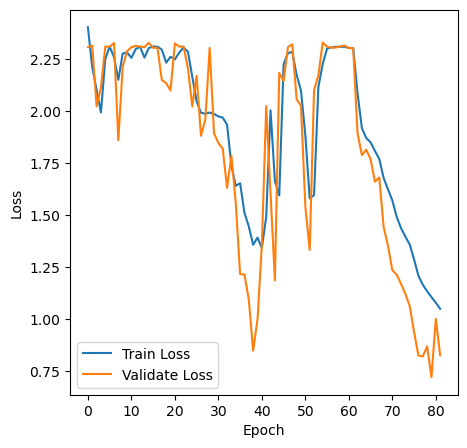

 41%|███████████████████████████████▏                                            | 82/200 [5:22:28<7:33:58, 230.84s/it]

Epoch:82
Time:5:26:09.894396
Loss:0.7292288060005481
Total:10000  Correct:7596  CleanAccuracy:0.7596


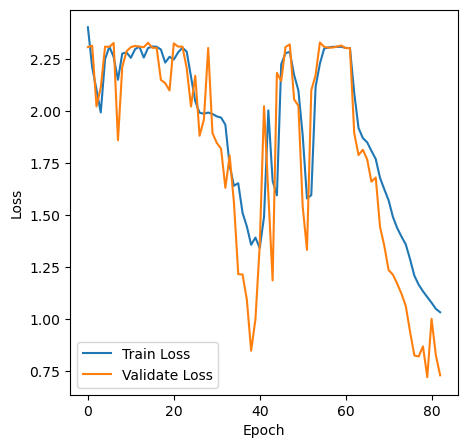

 42%|███████████████████████████████▌                                            | 83/200 [5:26:19<7:30:04, 230.80s/it]

Epoch:83
Time:5:30:00.407671
Loss:0.7913229748273429
Total:10000  Correct:7305  CleanAccuracy:0.7305


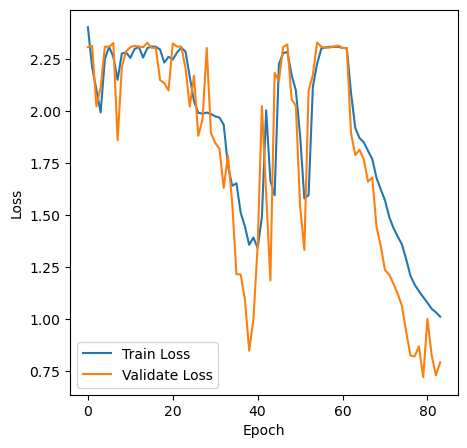

 42%|███████████████████████████████▉                                            | 84/200 [5:30:09<7:25:59, 230.69s/it]

Epoch:84
Time:5:33:50.493549
Loss:0.7448919335493265
Total:10000  Correct:7468  CleanAccuracy:0.7468


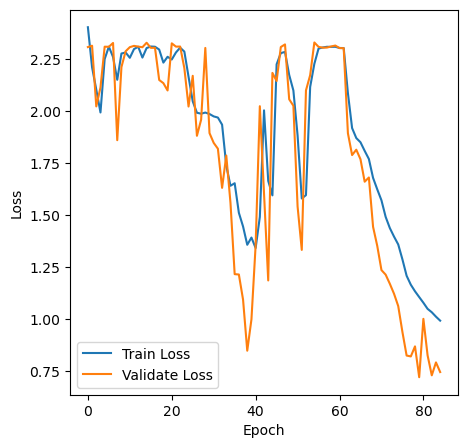

 42%|████████████████████████████████▎                                           | 85/200 [5:34:00<7:21:50, 230.52s/it]

Epoch:85
Time:5:37:41.490172
Loss:0.6738272778713665
Total:10000  Correct:7828  CleanAccuracy:0.7828


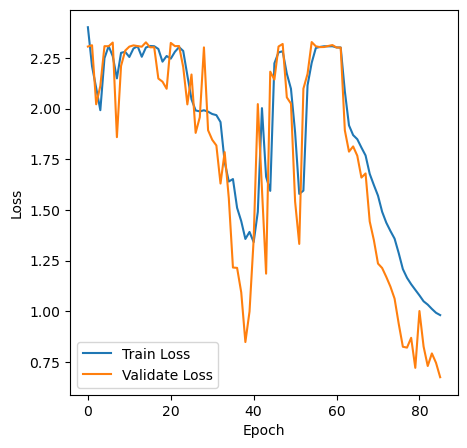

 43%|████████████████████████████████▋                                           | 86/200 [5:37:51<7:18:16, 230.67s/it]

Epoch:86
Time:5:41:31.889256
Loss:0.6353115040463762
Total:10000  Correct:7872  CleanAccuracy:0.7872


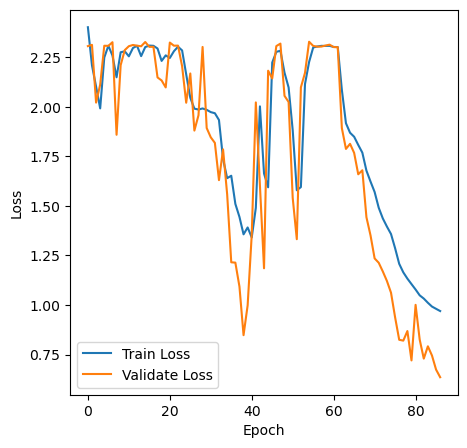

 44%|█████████████████████████████████                                           | 87/200 [5:41:41<7:14:13, 230.56s/it]

Epoch:87
Time:5:45:20.754999
Loss:0.6710025330130666
Total:10000  Correct:7717  CleanAccuracy:0.7717


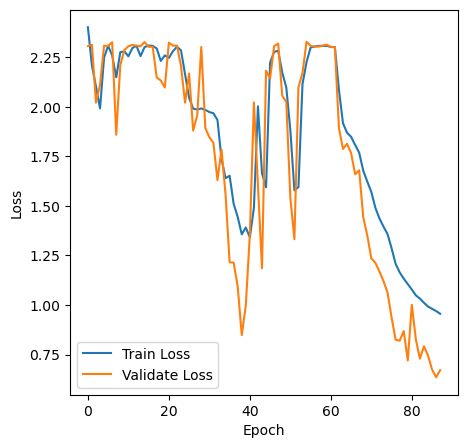

 44%|█████████████████████████████████▍                                          | 88/200 [5:45:30<7:09:22, 230.02s/it]

Epoch:88
Time:5:49:09.184281
Loss:0.7348671860207384
Total:10000  Correct:7367  CleanAccuracy:0.7367


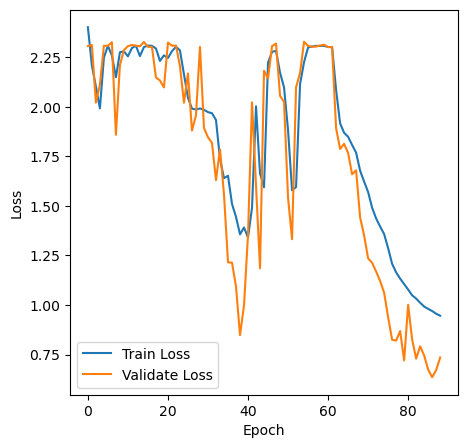

 44%|█████████████████████████████████▊                                          | 89/200 [5:49:18<7:04:45, 229.60s/it]

Epoch:89
Time:5:52:59.740296
Loss:0.6412149990519015
Total:10000  Correct:7813  CleanAccuracy:0.7813


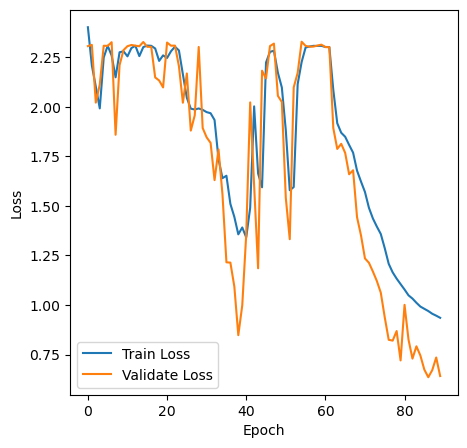

 45%|██████████████████████████████████▏                                         | 90/200 [5:53:08<7:01:10, 229.73s/it]

Epoch:90
Time:5:56:48.974400
Loss:0.5791181828172062
Total:10000  Correct:8027  CleanAccuracy:0.8027


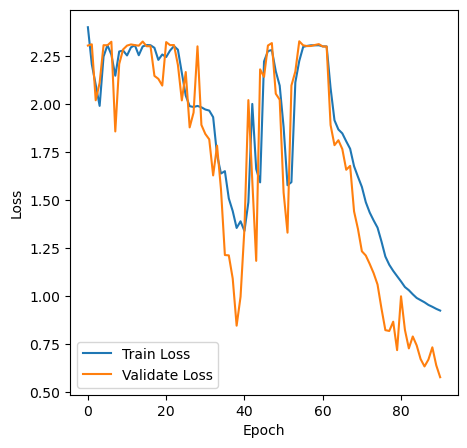

 46%|██████████████████████████████████▌                                         | 91/200 [5:56:58<6:57:22, 229.74s/it]

Epoch:91
Time:6:00:38.029392
Loss:0.6067811486343987
Total:10000  Correct:8000  CleanAccuracy:0.8000


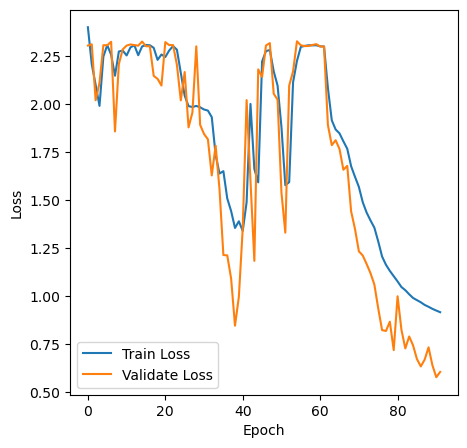

 46%|██████████████████████████████████▉                                         | 92/200 [6:00:47<6:53:01, 229.46s/it]

Epoch:92
Time:6:04:24.598907
Loss:0.651625882322415
Total:10000  Correct:7768  CleanAccuracy:0.7768


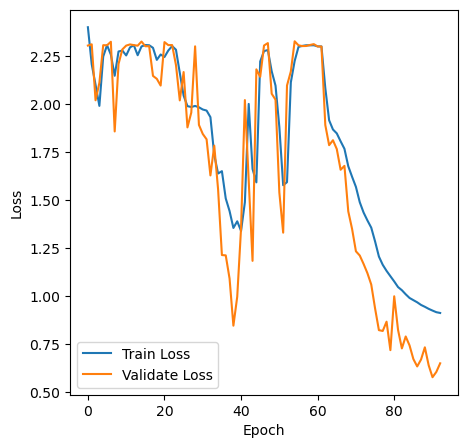

 46%|███████████████████████████████████▎                                        | 93/200 [6:04:33<6:47:38, 228.58s/it]

Epoch:93
Time:6:08:13.673050
Loss:0.6991364049454467
Total:10000  Correct:7577  CleanAccuracy:0.7577


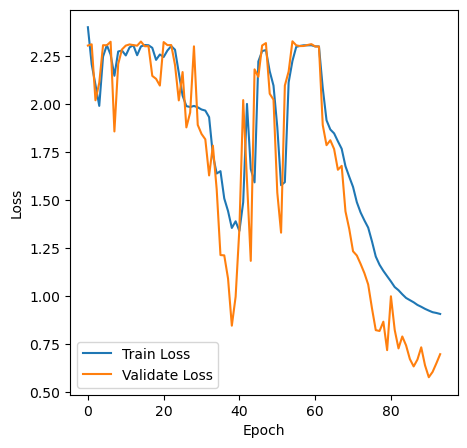

 47%|███████████████████████████████████▋                                        | 94/200 [6:08:22<6:44:01, 228.70s/it]

Epoch:94
Time:6:12:02.803327
Loss:0.6203791049722666
Total:10000  Correct:7928  CleanAccuracy:0.7928


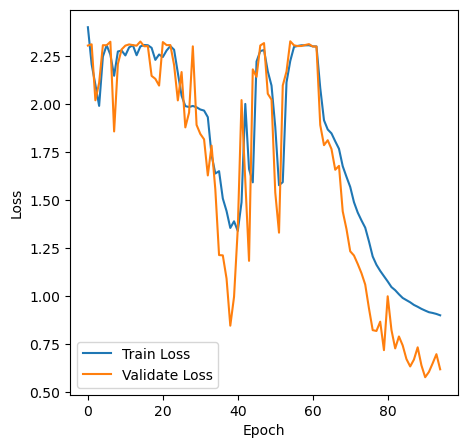

 48%|████████████████████████████████████                                        | 95/200 [6:12:12<6:40:39, 228.95s/it]

Epoch:95
Time:6:15:53.586986
Loss:0.6599917147106256
Total:10000  Correct:7704  CleanAccuracy:0.7704


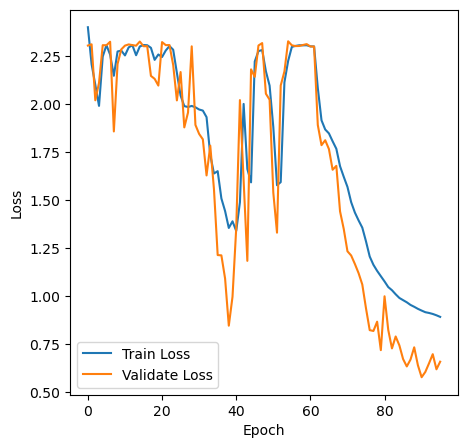

 48%|████████████████████████████████████▍                                       | 96/200 [6:16:02<6:37:40, 229.43s/it]

Epoch:96
Time:6:19:43.336897
Loss:0.6084236341733902
Total:10000  Correct:7930  CleanAccuracy:0.7930


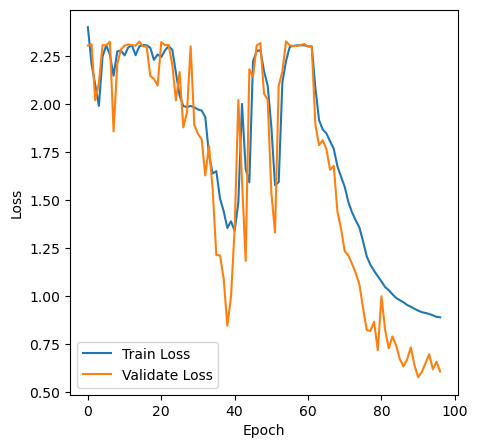

 48%|████████████████████████████████████▊                                       | 97/200 [6:19:52<6:34:07, 229.59s/it]

Epoch:97
Time:6:23:33.231758
Loss:0.6323975756907234
Total:10000  Correct:7924  CleanAccuracy:0.7924


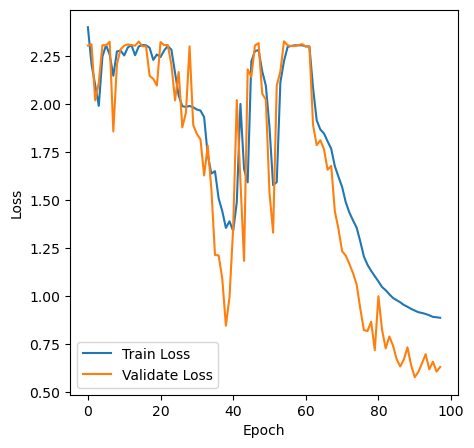

 49%|█████████████████████████████████████▏                                      | 98/200 [6:23:42<6:30:26, 229.67s/it]

Epoch:98
Time:6:27:31.279572
Loss:0.5413571899405684
Total:10000  Correct:8204  CleanAccuracy:0.8204


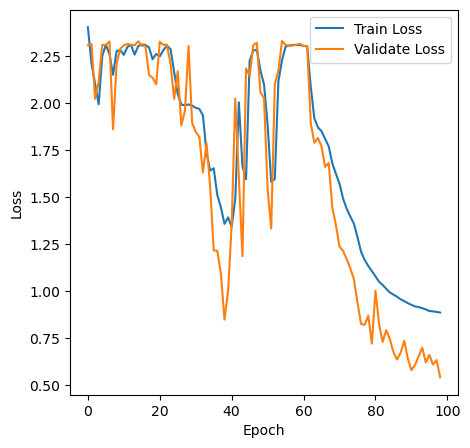

 50%|█████████████████████████████████████▌                                      | 99/200 [6:27:40<6:30:53, 232.22s/it]

Epoch:99
Time:6:31:22.225945
Loss:0.6155387518790584
Total:10000  Correct:7892  CleanAccuracy:0.7892


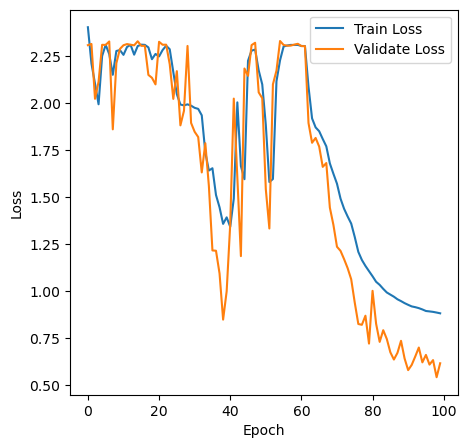

 50%|█████████████████████████████████████▌                                     | 100/200 [6:31:31<6:26:22, 231.82s/it]

Epoch:100
Time:6:35:13.713558
Loss:0.5660307377862474
Total:10000  Correct:8083  CleanAccuracy:0.8083


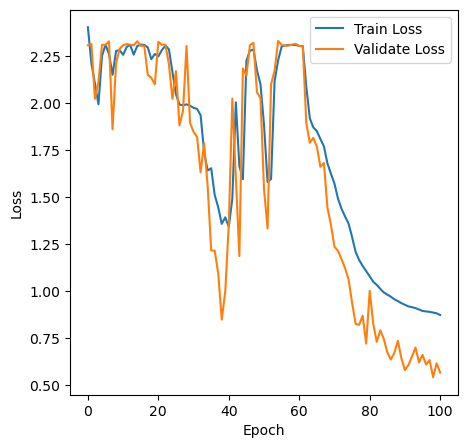

 50%|█████████████████████████████████████▉                                     | 101/200 [6:35:23<6:22:23, 231.75s/it]

Epoch:101
Time:6:39:04.772806
Loss:0.637657355624266
Total:10000  Correct:7875  CleanAccuracy:0.7875


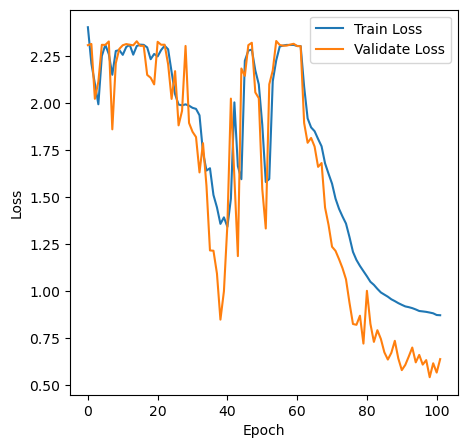

 51%|██████████████████████████████████████▎                                    | 102/200 [6:39:14<6:18:06, 231.49s/it]

Epoch:102
Time:6:42:54.218459
Loss:0.5559506080687617
Total:10000  Correct:8128  CleanAccuracy:0.8128


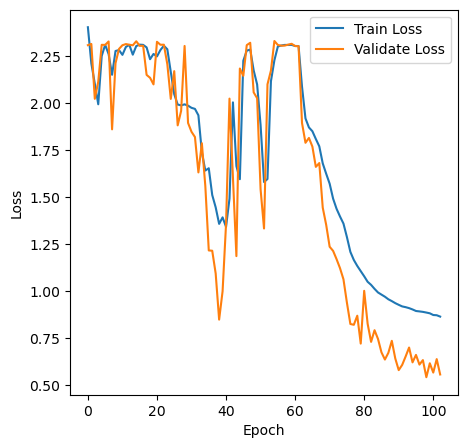

 52%|██████████████████████████████████████▋                                    | 103/200 [6:43:03<6:13:16, 230.89s/it]

Epoch:103
Time:6:46:44.808928
Loss:0.6008014492809582
Total:10000  Correct:7946  CleanAccuracy:0.7946


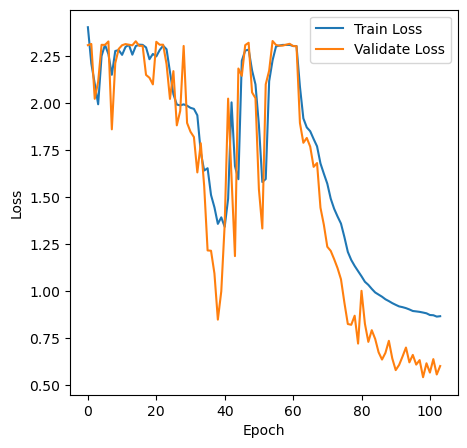

 52%|███████████████████████████████████████                                    | 104/200 [6:46:54<6:09:12, 230.76s/it]

Epoch:104
Time:6:50:35.068833
Loss:0.6040211941201847
Total:10000  Correct:7982  CleanAccuracy:0.7982


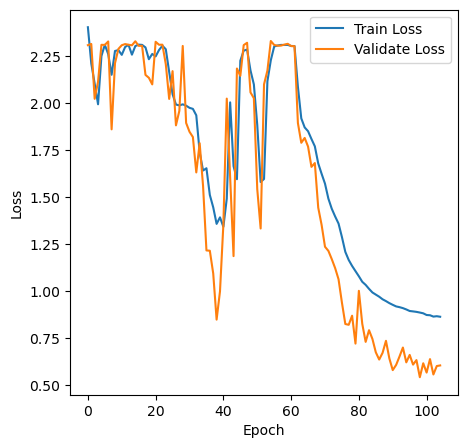

 52%|███████████████████████████████████████▍                                   | 105/200 [6:50:44<6:05:12, 230.65s/it]

Epoch:105
Time:6:54:26.076212
Loss:0.6707155374578013
Total:10000  Correct:7661  CleanAccuracy:0.7661


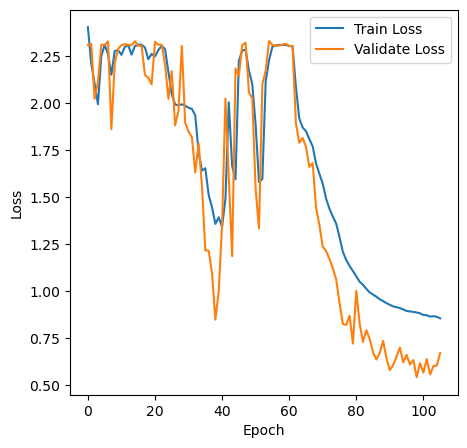

 53%|███████████████████████████████████████▊                                   | 106/200 [6:54:35<6:01:30, 230.75s/it]

Epoch:106
Time:6:58:15.794764
Loss:0.6109987881998665
Total:10000  Correct:8053  CleanAccuracy:0.8053


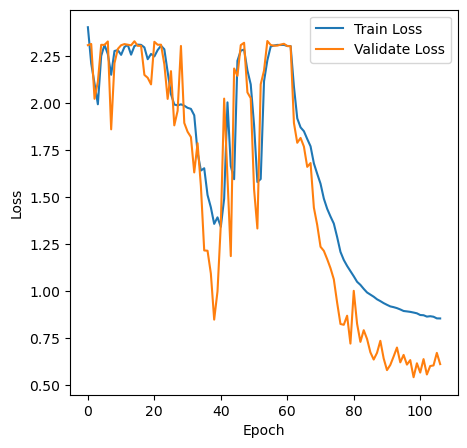

 54%|████████████████████████████████████████▏                                  | 107/200 [6:58:25<5:57:09, 230.42s/it]

Epoch:107
Time:7:02:04.827501
Loss:0.6121558548448185
Total:10000  Correct:7894  CleanAccuracy:0.7894


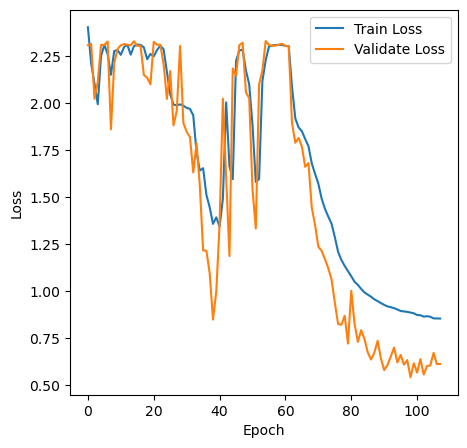

 54%|████████████████████████████████████████▌                                  | 108/200 [7:02:14<5:52:41, 230.02s/it]

Epoch:108
Time:7:05:54.341371
Loss:0.5962265893674126
Total:10000  Correct:7986  CleanAccuracy:0.7986


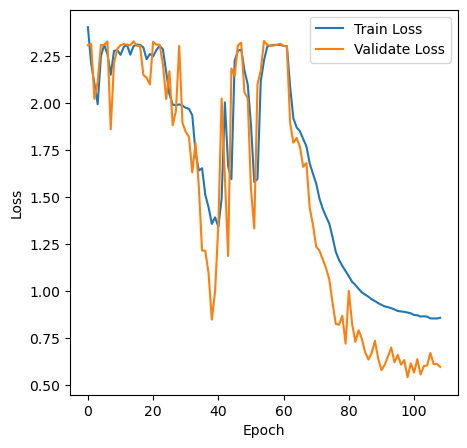

 55%|████████████████████████████████████████▉                                  | 109/200 [7:06:03<5:48:27, 229.75s/it]

Epoch:109
Time:7:09:44.254996
Loss:0.5807523645532017
Total:10000  Correct:8033  CleanAccuracy:0.8033


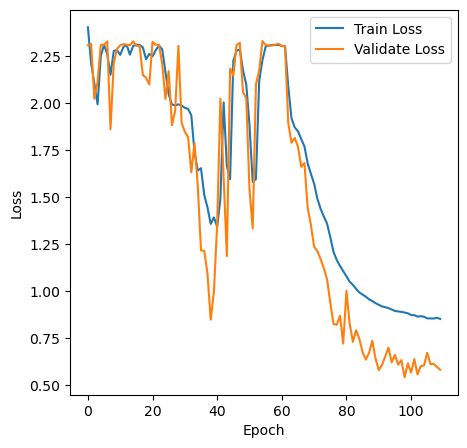

 55%|█████████████████████████████████████████▎                                 | 110/200 [7:09:53<5:44:39, 229.77s/it]

Epoch:110
Time:7:13:33.587449
Loss:0.6107909360442298
Total:10000  Correct:7973  CleanAccuracy:0.7973


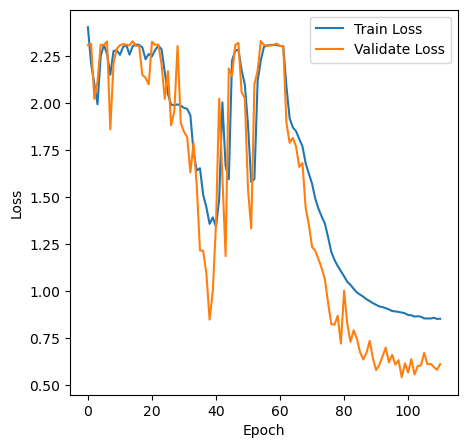

 56%|█████████████████████████████████████████▋                                 | 111/200 [7:13:42<5:40:25, 229.50s/it]

Epoch:111
Time:7:17:21.597839
Loss:0.5934613258503496
Total:10000  Correct:7925  CleanAccuracy:0.7925


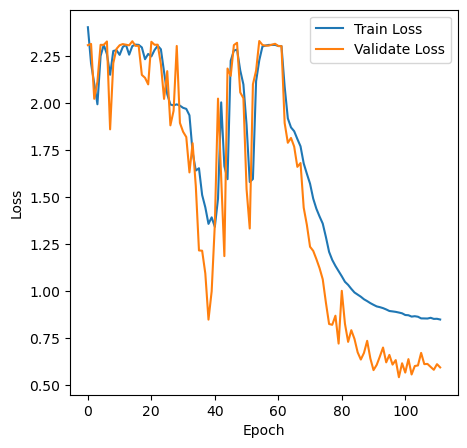

 56%|██████████████████████████████████████████                                 | 112/200 [7:17:31<5:36:21, 229.33s/it]

Epoch:112
Time:7:21:10.940526
Loss:0.6490278667725694
Total:10000  Correct:7787  CleanAccuracy:0.7787


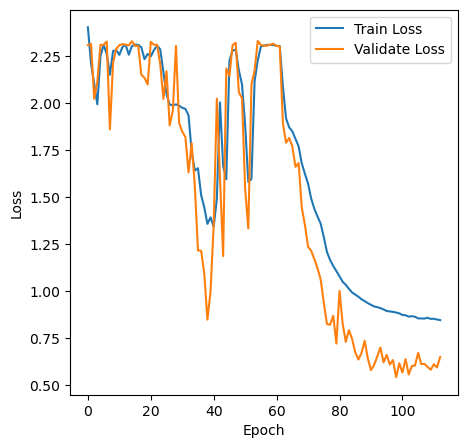

 56%|██████████████████████████████████████████▎                                | 113/200 [7:21:20<5:32:28, 229.29s/it]

Epoch:113
Time:7:25:00.498389
Loss:0.5958064595064797
Total:10000  Correct:8048  CleanAccuracy:0.8048


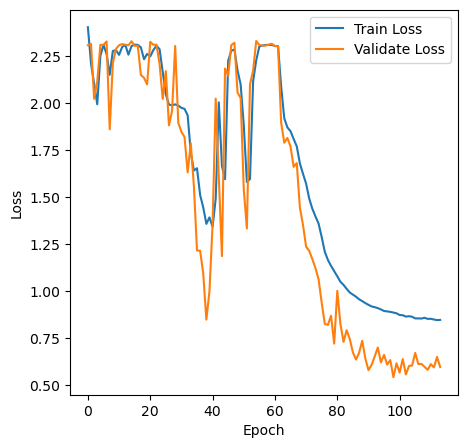

 57%|██████████████████████████████████████████▋                                | 114/200 [7:25:10<5:28:51, 229.44s/it]

Epoch:114
Time:7:28:50.839329
Loss:0.7280620068026046
Total:10000  Correct:7477  CleanAccuracy:0.7477


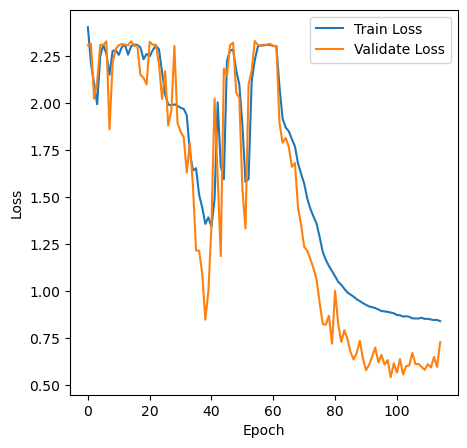

 57%|███████████████████████████████████████████▏                               | 115/200 [7:29:00<5:25:20, 229.65s/it]

Epoch:115
Time:7:32:40.963671
Loss:0.5947066167006477
Total:10000  Correct:8048  CleanAccuracy:0.8048


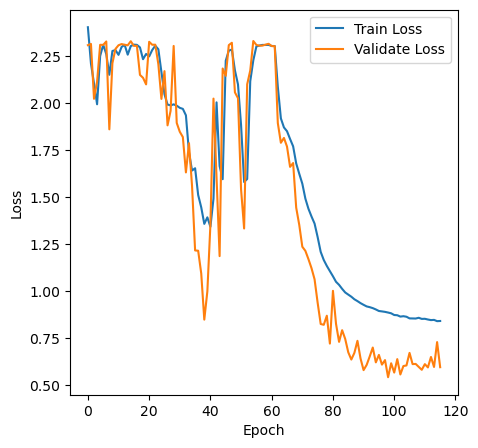

 58%|███████████████████████████████████████████▌                               | 116/200 [7:32:50<5:21:51, 229.90s/it]

Epoch:116
Time:7:36:31.139841
Loss:0.5838600156215814
Total:10000  Correct:8044  CleanAccuracy:0.8044


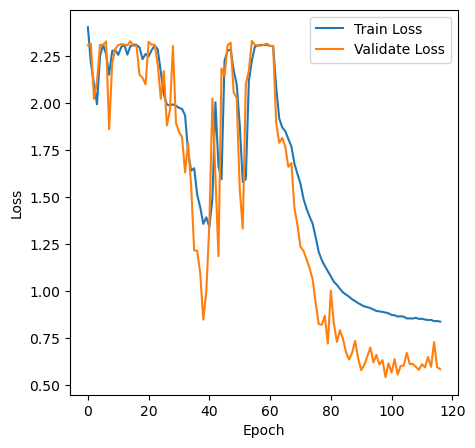

 58%|███████████████████████████████████████████▉                               | 117/200 [7:36:40<5:17:58, 229.87s/it]

Epoch:117
Time:7:40:20.703670
Loss:0.6892674036871511
Total:10000  Correct:7547  CleanAccuracy:0.7547


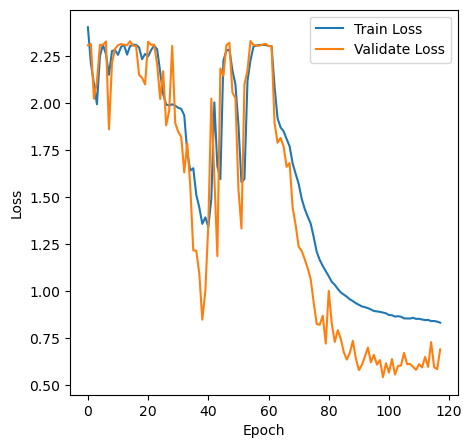

 59%|████████████████████████████████████████████▎                              | 118/200 [7:40:29<5:13:39, 229.51s/it]

Epoch:118
Time:7:44:09.959015
Loss:0.4884823950620505
Total:10000  Correct:8379  CleanAccuracy:0.8379


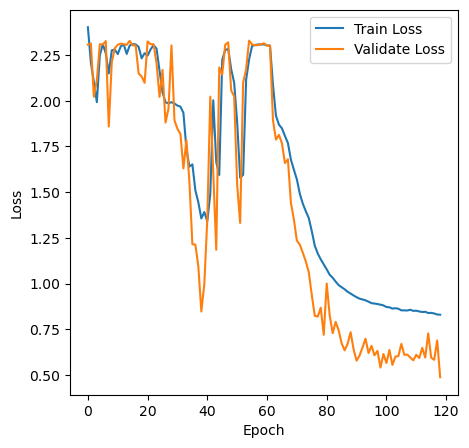

 60%|████████████████████████████████████████████▋                              | 119/200 [7:44:19<5:10:07, 229.73s/it]

Epoch:119
Time:7:48:00.043561
Loss:0.54425116026173
Total:10000  Correct:8228  CleanAccuracy:0.8228


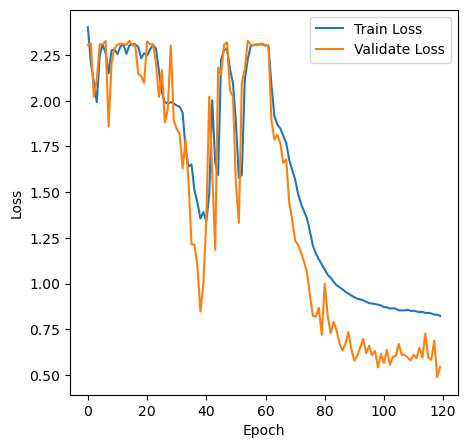

 60%|█████████████████████████████████████████████                              | 120/200 [7:48:09<5:06:29, 229.87s/it]

Epoch:120
Time:7:51:50.500134
Loss:0.47705349397545044
Total:10000  Correct:8467  CleanAccuracy:0.8467


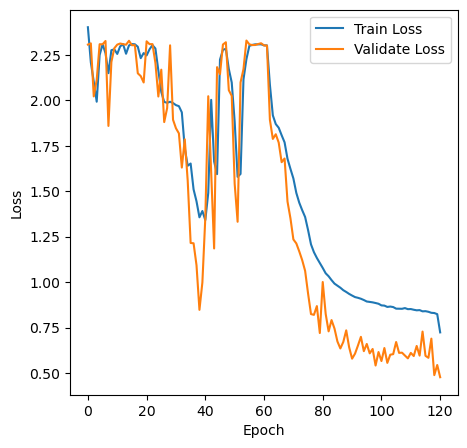

 60%|█████████████████████████████████████████████▍                             | 121/200 [7:52:00<5:02:54, 230.06s/it]

Epoch:121
Time:7:55:40.813729
Loss:0.48909093618107297
Total:10000  Correct:8397  CleanAccuracy:0.8397


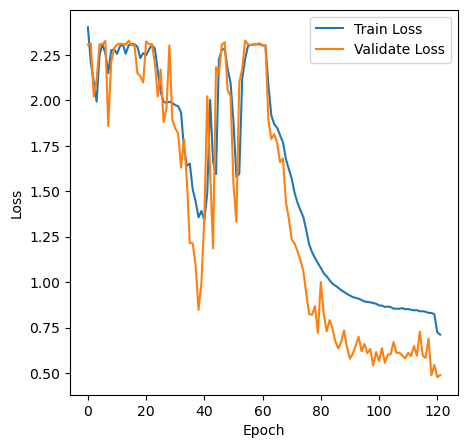

 61%|█████████████████████████████████████████████▊                             | 122/200 [7:55:50<4:59:07, 230.09s/it]

Epoch:122
Time:7:59:29.334306
Loss:0.49122193258124797
Total:10000  Correct:8399  CleanAccuracy:0.8399


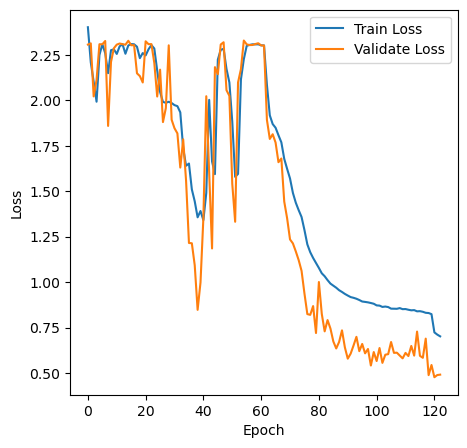

 62%|██████████████████████████████████████████████▏                            | 123/200 [7:59:38<4:54:40, 229.62s/it]

Epoch:123
Time:8:03:19.017625
Loss:0.5060577473987025
Total:10000  Correct:8349  CleanAccuracy:0.8349


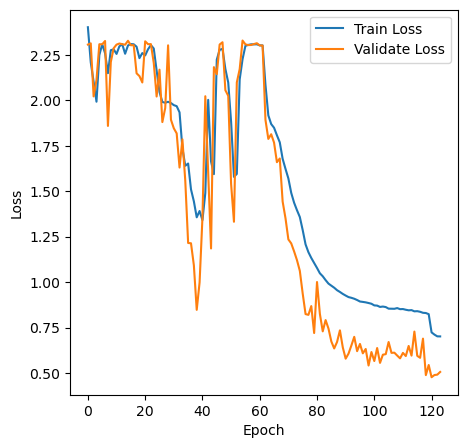

 62%|██████████████████████████████████████████████▌                            | 124/200 [8:03:28<4:50:56, 229.69s/it]

Epoch:124
Time:8:07:09.041750
Loss:0.5021906647438439
Total:10000  Correct:8371  CleanAccuracy:0.8371


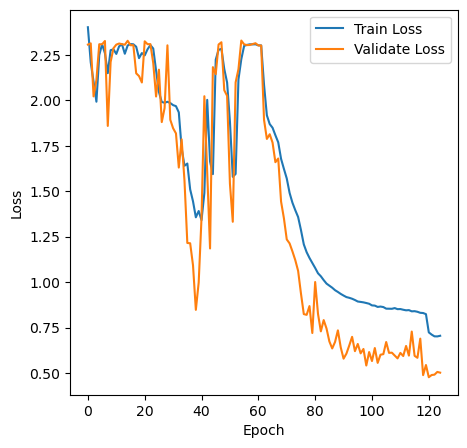

 62%|██████████████████████████████████████████████▉                            | 125/200 [8:07:17<4:46:49, 229.46s/it]

Epoch:125
Time:8:10:57.705914
Loss:0.4781634447911677
Total:10000  Correct:8463  CleanAccuracy:0.8463


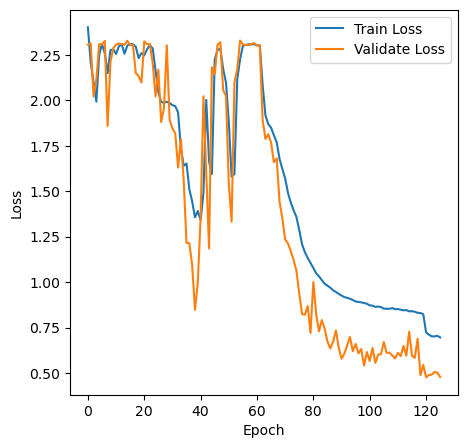

 63%|███████████████████████████████████████████████▎                           | 126/200 [8:11:06<4:42:46, 229.28s/it]

Epoch:126
Time:8:14:47.604955
Loss:0.5235725423446098
Total:10000  Correct:8279  CleanAccuracy:0.8279


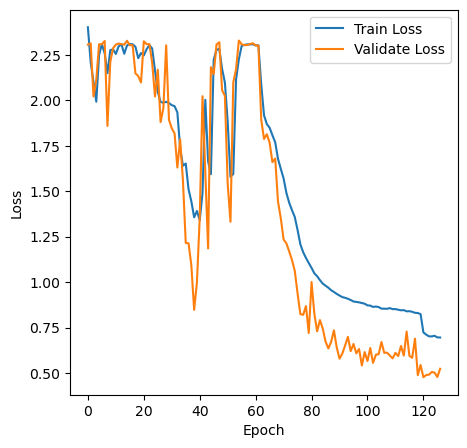

 64%|███████████████████████████████████████████████▋                           | 127/200 [8:14:56<4:39:13, 229.49s/it]

Epoch:127
Time:8:18:37.305362
Loss:0.5171950847243729
Total:10000  Correct:8299  CleanAccuracy:0.8299


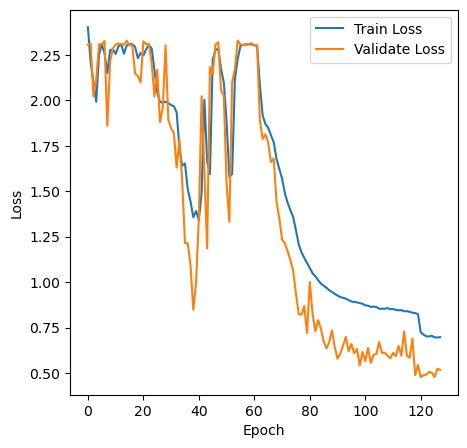

 64%|████████████████████████████████████████████████                           | 128/200 [8:18:46<4:35:46, 229.81s/it]

Epoch:128
Time:8:22:26.992187
Loss:0.4806194123083029
Total:10000  Correct:8467  CleanAccuracy:0.8467


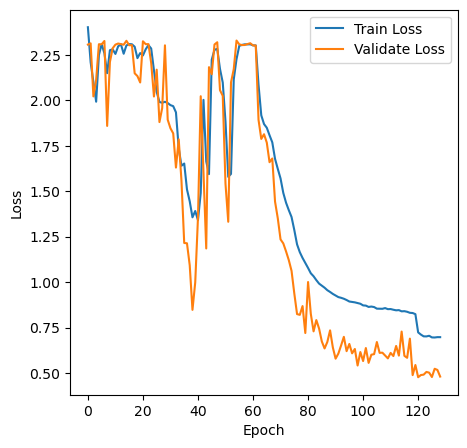

 64%|████████████████████████████████████████████████▍                          | 129/200 [8:22:36<4:31:49, 229.72s/it]

Epoch:129
Time:8:26:16.366587
Loss:0.4926188615516733
Total:10000  Correct:8358  CleanAccuracy:0.8358


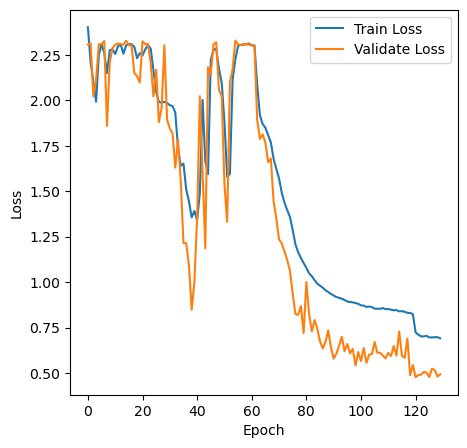

 65%|████████████████████████████████████████████████▊                          | 130/200 [8:26:25<4:27:55, 229.65s/it]

Epoch:130
Time:8:30:06.244269
Loss:0.49852303758311195
Total:10000  Correct:8396  CleanAccuracy:0.8396


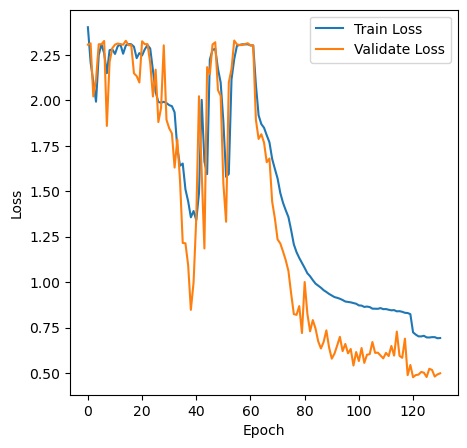

 66%|█████████████████████████████████████████████████▏                         | 131/200 [8:30:15<4:24:08, 229.69s/it]

Epoch:131
Time:8:33:57.313784
Loss:0.4606366579810651
Total:10000  Correct:8521  CleanAccuracy:0.8521


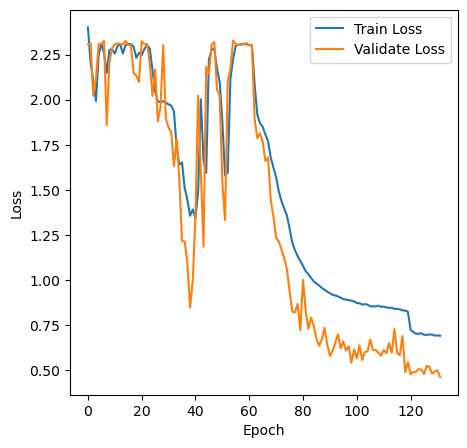

 66%|█████████████████████████████████████████████████▌                         | 132/200 [8:34:06<4:20:49, 230.13s/it]

Epoch:132
Time:8:37:48.564247
Loss:0.5382154945748302
Total:10000  Correct:8276  CleanAccuracy:0.8276


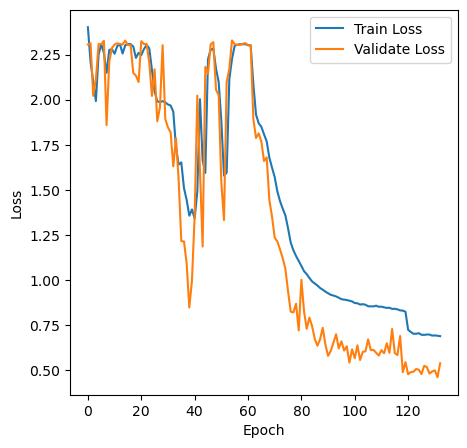

 66%|█████████████████████████████████████████████████▉                         | 133/200 [8:37:58<4:17:21, 230.48s/it]

Epoch:133
Time:8:41:39.126450
Loss:0.47788175209737815
Total:10000  Correct:8455  CleanAccuracy:0.8455


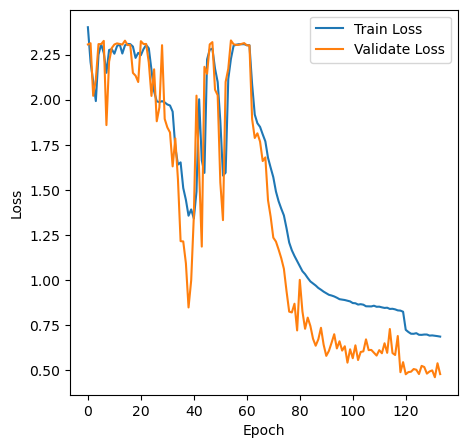

 67%|██████████████████████████████████████████████████▎                        | 134/200 [8:41:48<4:13:32, 230.50s/it]

Epoch:134
Time:8:45:29.582466
Loss:0.49690919597975364
Total:10000  Correct:8376  CleanAccuracy:0.8376


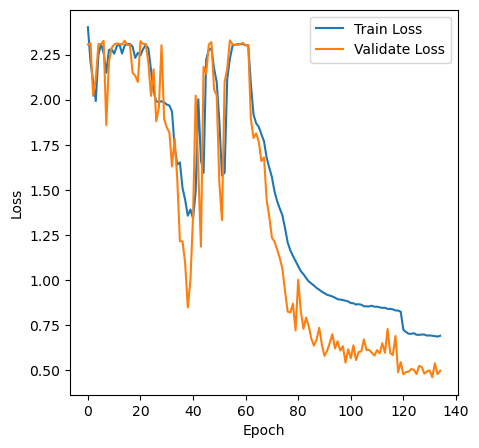

 68%|██████████████████████████████████████████████████▋                        | 135/200 [8:45:39<4:09:40, 230.47s/it]

Epoch:135
Time:8:49:19.843643
Loss:0.4601173533227878
Total:10000  Correct:8522  CleanAccuracy:0.8522


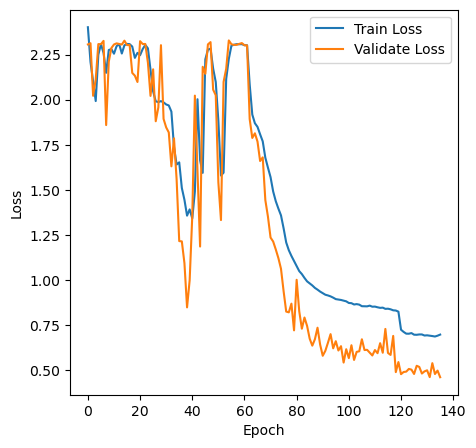

 68%|███████████████████████████████████████████████████                        | 136/200 [8:49:29<4:05:48, 230.44s/it]

Epoch:136
Time:8:53:10.898447
Loss:0.4808358699083328
Total:10000  Correct:8419  CleanAccuracy:0.8419


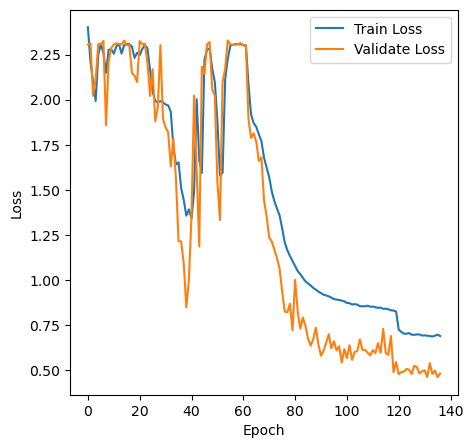

 68%|███████████████████████████████████████████████████▍                       | 137/200 [8:53:20<4:02:05, 230.57s/it]

Epoch:137
Time:8:57:01.900525
Loss:0.5116432535286528
Total:10000  Correct:8342  CleanAccuracy:0.8342


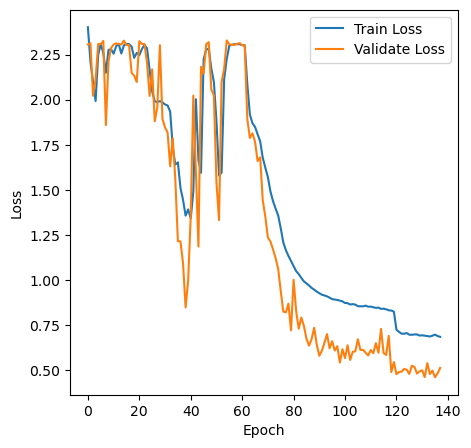

 69%|███████████████████████████████████████████████████▋                       | 138/200 [8:57:11<3:58:31, 230.83s/it]

Epoch:138
Time:9:00:51.978589
Loss:0.4899915226113301
Total:10000  Correct:8351  CleanAccuracy:0.8351


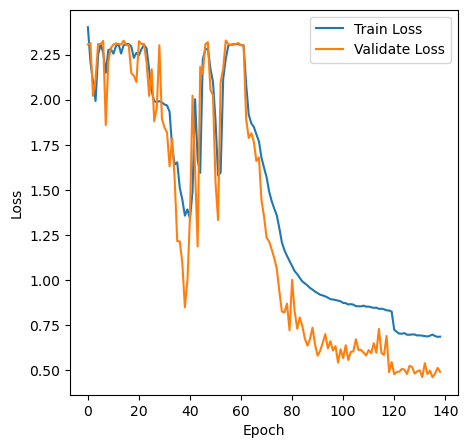

 70%|████████████████████████████████████████████████████                       | 139/200 [9:01:01<3:54:18, 230.47s/it]

Epoch:139
Time:9:04:42.808748
Loss:0.46361264486472825
Total:10000  Correct:8516  CleanAccuracy:0.8516


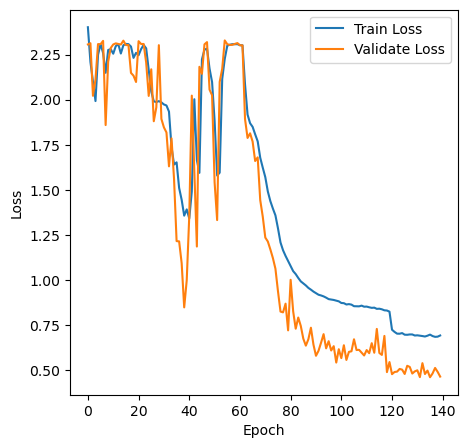

 70%|████████████████████████████████████████████████████▌                      | 140/200 [9:04:52<3:50:38, 230.64s/it]

Epoch:140
Time:9:08:33.691486
Loss:0.4697544373833714
Total:10000  Correct:8500  CleanAccuracy:0.8500


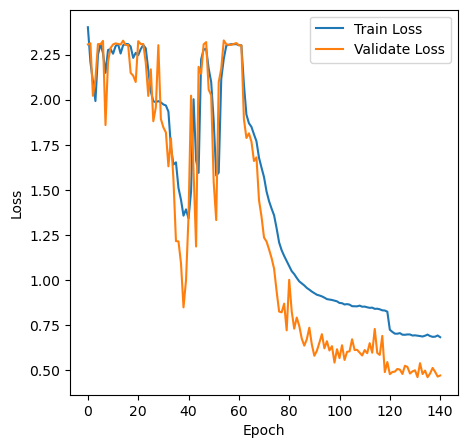

 70%|████████████████████████████████████████████████████▉                      | 141/200 [9:08:43<3:46:50, 230.69s/it]

Epoch:141
Time:9:12:23.718602
Loss:0.5682777062582132
Total:10000  Correct:8094  CleanAccuracy:0.8094


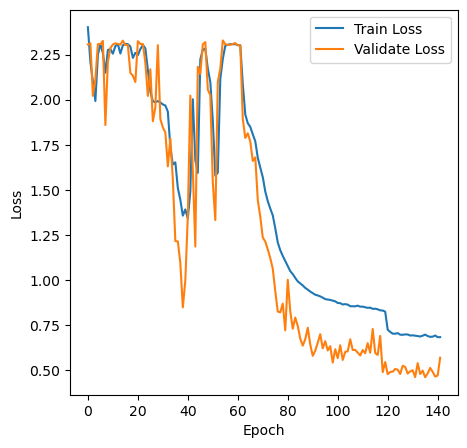

 71%|█████████████████████████████████████████████████████▎                     | 142/200 [9:12:33<3:42:44, 230.43s/it]

Epoch:142
Time:9:16:13.188870
Loss:0.5094427711571368
Total:10000  Correct:8378  CleanAccuracy:0.8378


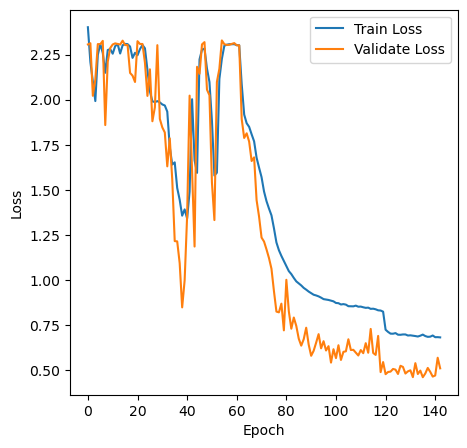

 72%|█████████████████████████████████████████████████████▋                     | 143/200 [9:16:22<3:38:30, 230.01s/it]

Epoch:143
Time:9:20:02.602205
Loss:0.530856004395424
Total:10000  Correct:8295  CleanAccuracy:0.8295


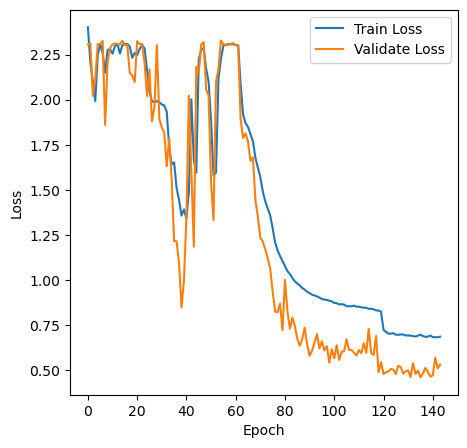

 72%|██████████████████████████████████████████████████████                     | 144/200 [9:20:11<3:34:31, 229.85s/it]

Epoch:144
Time:9:23:51.565410
Loss:0.4499462438753238
Total:10000  Correct:8575  CleanAccuracy:0.8575


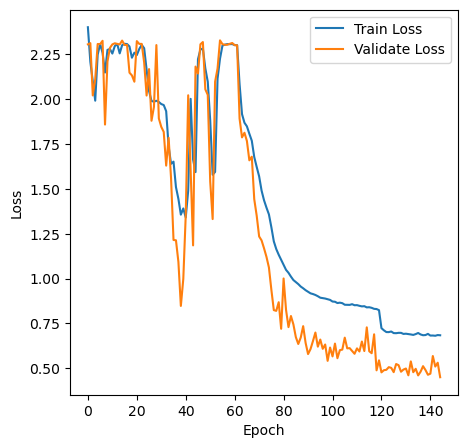

 72%|██████████████████████████████████████████████████████▍                    | 145/200 [9:24:01<3:30:35, 229.74s/it]

Epoch:145
Time:9:27:41.551265
Loss:0.5420515726739987
Total:10000  Correct:8209  CleanAccuracy:0.8209


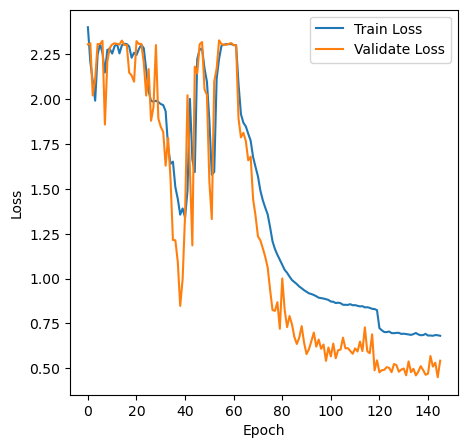

 73%|██████████████████████████████████████████████████████▊                    | 146/200 [9:27:50<3:26:33, 229.52s/it]

Epoch:146
Time:9:31:30.798986
Loss:0.5166101827027317
Total:10000  Correct:8306  CleanAccuracy:0.8306


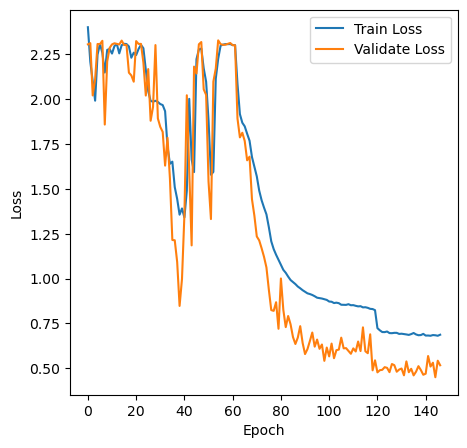

 74%|███████████████████████████████████████████████████████▏                   | 147/200 [9:31:40<3:22:58, 229.79s/it]

Epoch:147
Time:9:35:20.941639
Loss:0.4360592278381125
Total:10000  Correct:8604  CleanAccuracy:0.8604


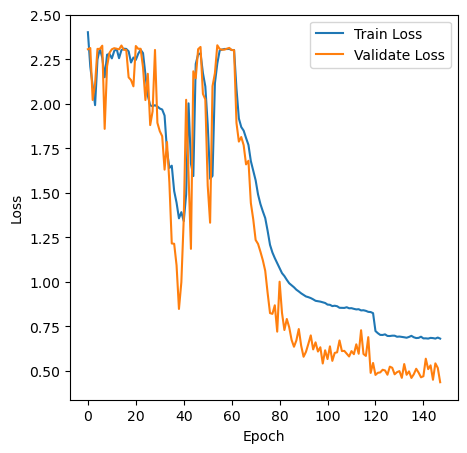

 74%|███████████████████████████████████████████████████████▌                   | 148/200 [9:35:30<3:19:13, 229.88s/it]

Epoch:148
Time:9:39:11.306269
Loss:0.4907882288336373
Total:10000  Correct:8445  CleanAccuracy:0.8445


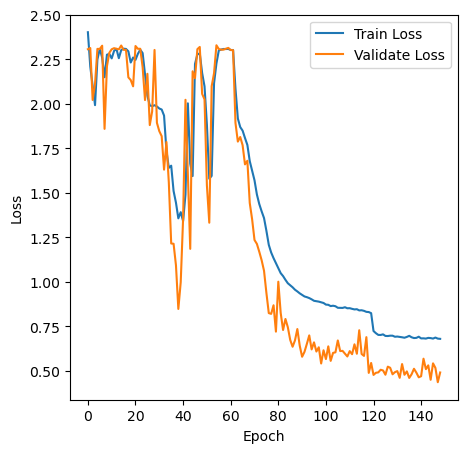

 74%|███████████████████████████████████████████████████████▉                   | 149/200 [9:39:20<3:15:31, 230.03s/it]

Epoch:149
Time:9:43:06.174281
Loss:0.5074463936562736
Total:10000  Correct:8382  CleanAccuracy:0.8382


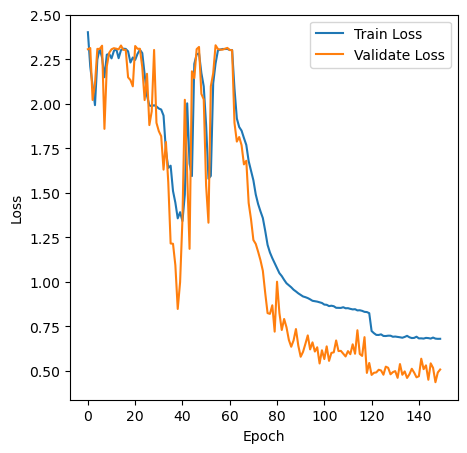

 75%|████████████████████████████████████████████████████████▎                  | 150/200 [9:43:15<3:12:51, 231.43s/it]

Epoch:150
Time:9:46:56.625870
Loss:0.46685081175245796
Total:10000  Correct:8503  CleanAccuracy:0.8503


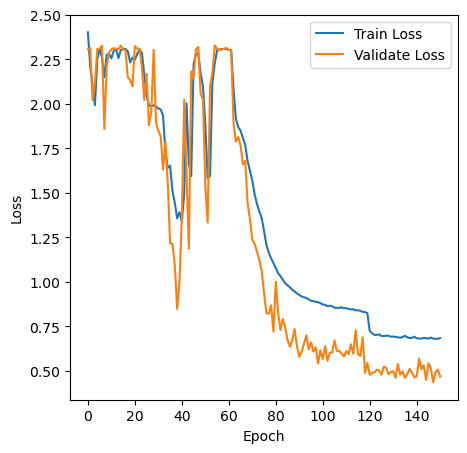

 76%|████████████████████████████████████████████████████████▋                  | 151/200 [9:47:06<3:08:45, 231.13s/it]

Epoch:151
Time:9:50:46.686281
Loss:0.5028887483449028
Total:10000  Correct:8361  CleanAccuracy:0.8361


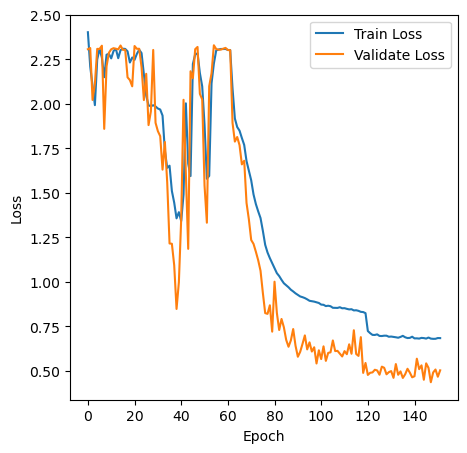

 76%|█████████████████████████████████████████████████████████                  | 152/200 [9:50:56<3:04:39, 230.81s/it]

Epoch:152
Time:9:54:35.727503
Loss:0.5404546047789982
Total:10000  Correct:8204  CleanAccuracy:0.8204


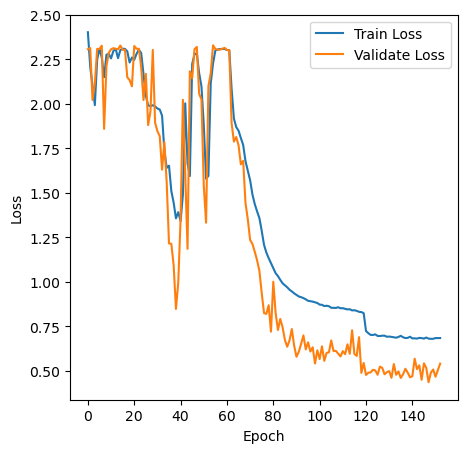

 76%|█████████████████████████████████████████████████████████▍                 | 153/200 [9:54:45<3:00:23, 230.30s/it]

Epoch:153
Time:9:58:26.042910
Loss:0.5769901392273248
Total:10000  Correct:8134  CleanAccuracy:0.8134


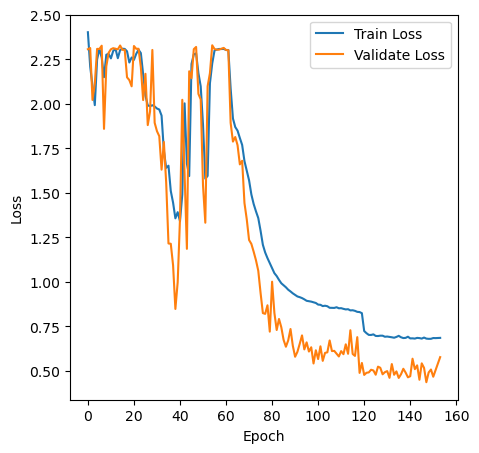

 77%|█████████████████████████████████████████████████████████▊                 | 154/200 [9:58:35<2:56:34, 230.33s/it]

Epoch:154
Time:10:02:21.857683
Loss:0.49354834276171156
Total:10000  Correct:8389  CleanAccuracy:0.8389


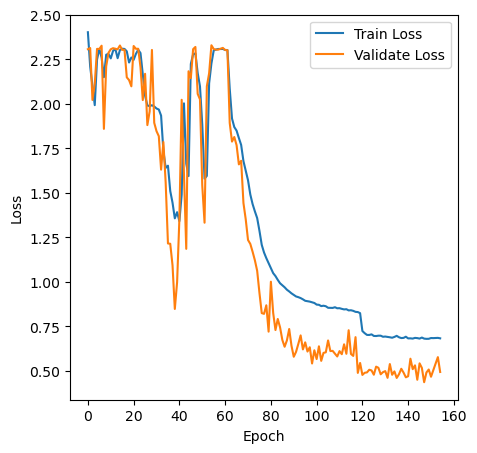

 78%|█████████████████████████████████████████████████████████▎                | 155/200 [10:02:31<2:53:57, 231.93s/it]

Epoch:155
Time:10:06:13.331757
Loss:0.4860108884664389
Total:10000  Correct:8402  CleanAccuracy:0.8402


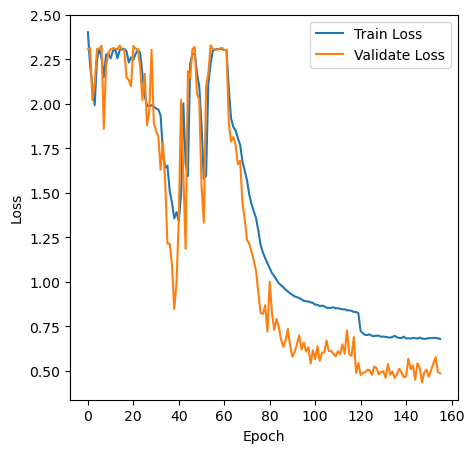

 78%|█████████████████████████████████████████████████████████▋                | 156/200 [10:06:22<2:50:00, 231.82s/it]

Epoch:156
Time:10:10:04.697401
Loss:0.47464177814630654
Total:10000  Correct:8500  CleanAccuracy:0.8500


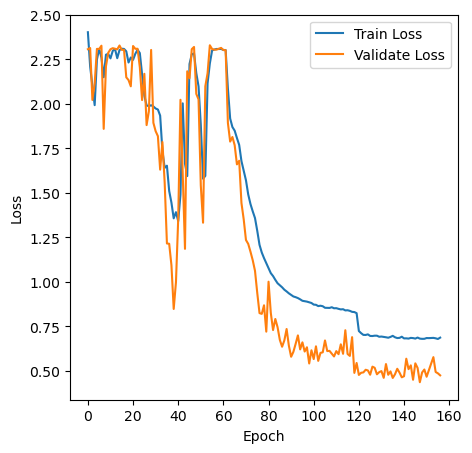

 78%|██████████████████████████████████████████████████████████                | 157/200 [10:10:14<2:46:03, 231.70s/it]

Epoch:157
Time:10:13:56.597856
Loss:0.5965197346747493
Total:10000  Correct:7997  CleanAccuracy:0.7997


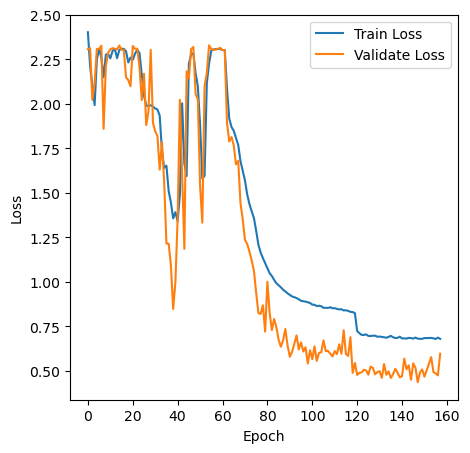

 79%|██████████████████████████████████████████████████████████▍               | 158/200 [10:14:06<2:42:11, 231.71s/it]

Epoch:158
Time:10:17:46.634758
Loss:0.46887684563478343
Total:10000  Correct:8471  CleanAccuracy:0.8471


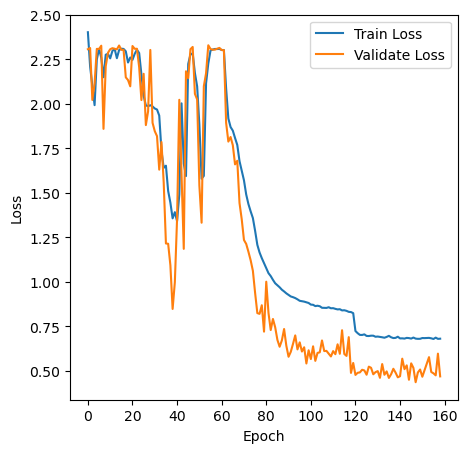

 80%|██████████████████████████████████████████████████████████▊               | 159/200 [10:17:54<2:37:45, 230.87s/it]

Epoch:159
Time:10:21:35.519382
Loss:0.5266332045530739
Total:10000  Correct:8267  CleanAccuracy:0.8267


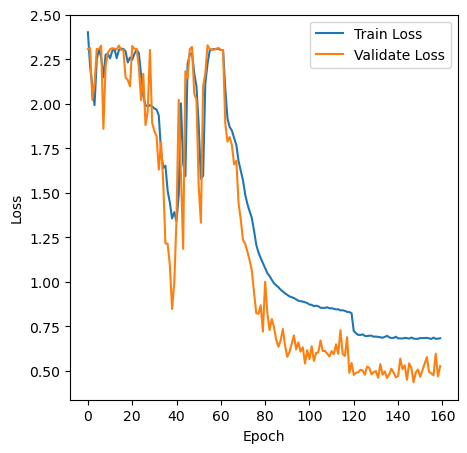

 80%|███████████████████████████████████████████████████████████▏              | 160/200 [10:21:44<2:33:36, 230.41s/it]

Epoch:160
Time:10:25:24.643500
Loss:0.4872225245443015
Total:10000  Correct:8405  CleanAccuracy:0.8405


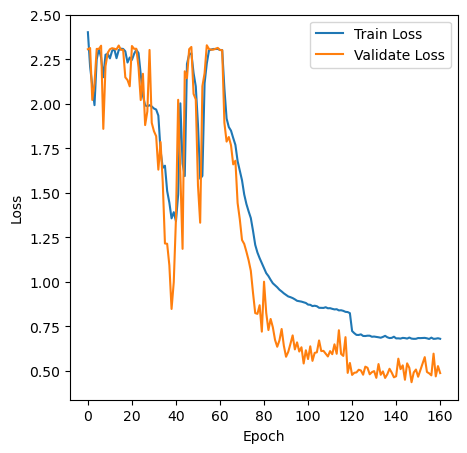

 80%|███████████████████████████████████████████████████████████▌              | 161/200 [10:25:33<2:29:32, 230.05s/it]

Epoch:161
Time:10:29:14.768602
Loss:0.5713135708635226
Total:10000  Correct:8095  CleanAccuracy:0.8095


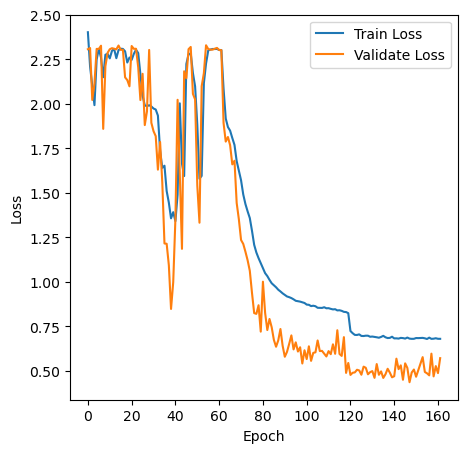

 81%|███████████████████████████████████████████████████████████▉              | 162/200 [10:29:24<2:25:52, 230.33s/it]

Epoch:162
Time:10:33:05.716565
Loss:0.5852795272779922
Total:10000  Correct:8079  CleanAccuracy:0.8079


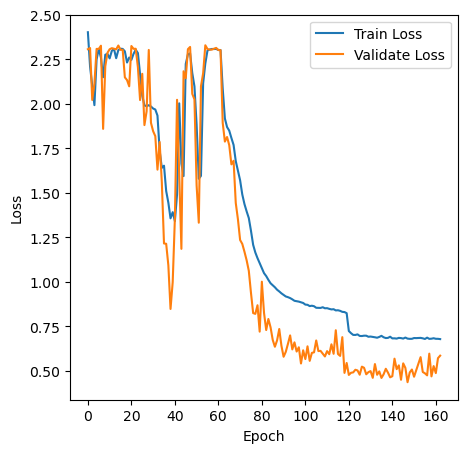

 82%|████████████████████████████████████████████████████████████▎             | 163/200 [10:33:15<2:22:08, 230.49s/it]

Epoch:163
Time:10:37:42.963200
Loss:0.4820954234788593
Total:10000  Correct:8457  CleanAccuracy:0.8457


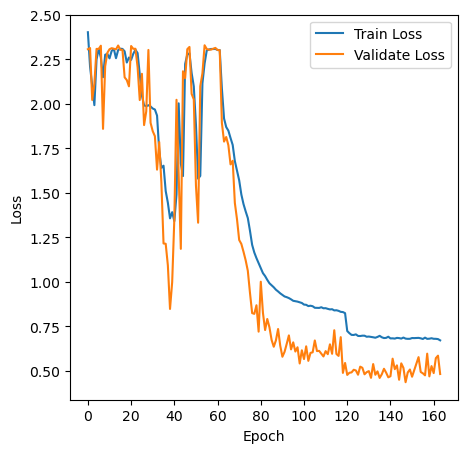

 82%|████████████████████████████████████████████████████████████▋             | 164/200 [10:37:54<2:27:02, 245.08s/it]

Epoch:164
Time:10:43:07.116197
Loss:0.5496183658084168
Total:10000  Correct:8203  CleanAccuracy:0.8203


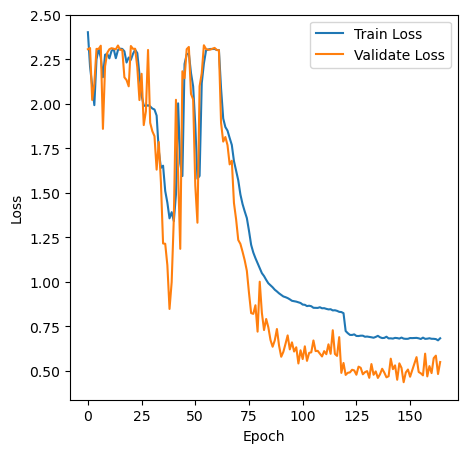

 82%|█████████████████████████████████████████████████████████████             | 165/200 [10:43:17<2:36:39, 268.57s/it]

Epoch:165
Time:10:47:55.735028
Loss:0.4931172402902914
Total:10000  Correct:8409  CleanAccuracy:0.8409


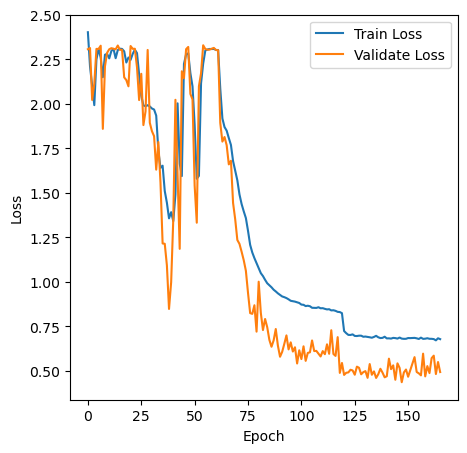

 83%|█████████████████████████████████████████████████████████████▍            | 166/200 [10:48:05<2:35:27, 274.33s/it]

Epoch:166
Time:10:52:07.504388
Loss:0.5435555162140355
Total:10000  Correct:8192  CleanAccuracy:0.8192


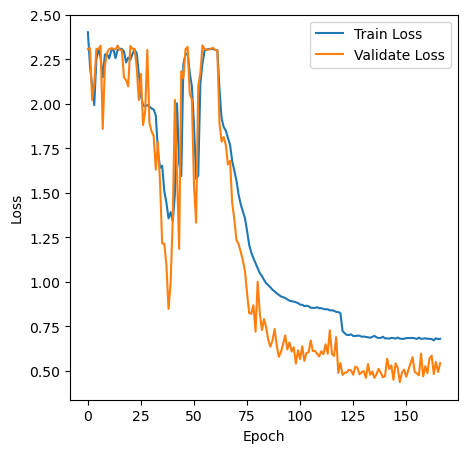

 84%|█████████████████████████████████████████████████████████████▊            | 167/200 [10:52:16<2:27:02, 267.36s/it]

Epoch:167
Time:10:56:19.164451
Loss:0.5690161272550163
Total:10000  Correct:8139  CleanAccuracy:0.8139


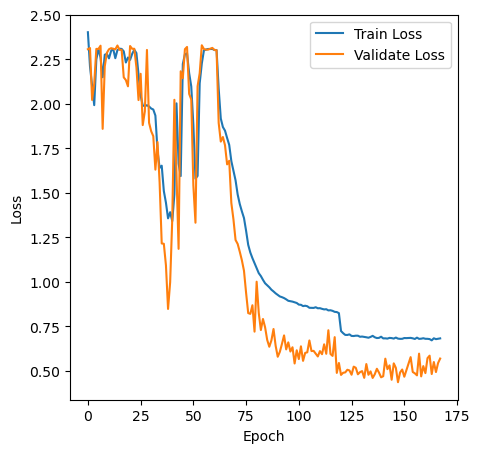

 84%|██████████████████████████████████████████████████████████████▏           | 168/200 [10:56:28<2:20:10, 262.82s/it]

Epoch:168
Time:11:00:43.009652
Loss:0.5138208462883489
Total:10000  Correct:8294  CleanAccuracy:0.8294


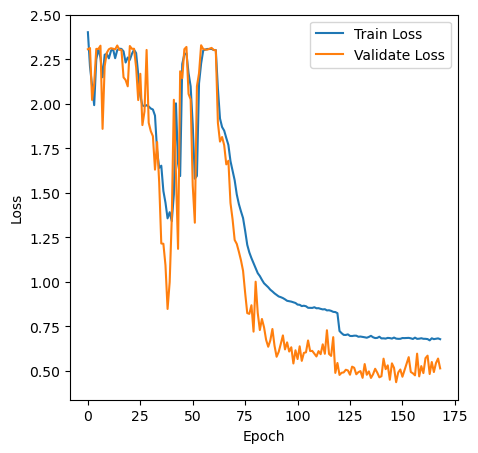

 84%|██████████████████████████████████████████████████████████████▌           | 169/200 [11:00:52<2:15:54, 263.05s/it]

Epoch:169
Time:11:05:05.393785
Loss:0.5436083860576343
Total:10000  Correct:8171  CleanAccuracy:0.8171


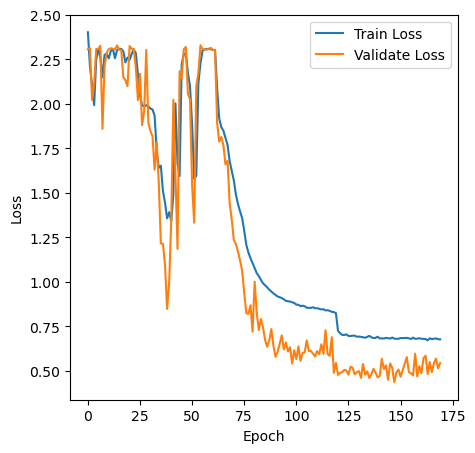

 85%|██████████████████████████████████████████████████████████████▉           | 170/200 [11:05:15<2:11:27, 262.93s/it]

Epoch:170
Time:11:09:28.749438
Loss:0.4526910220091335
Total:10000  Correct:8527  CleanAccuracy:0.8527


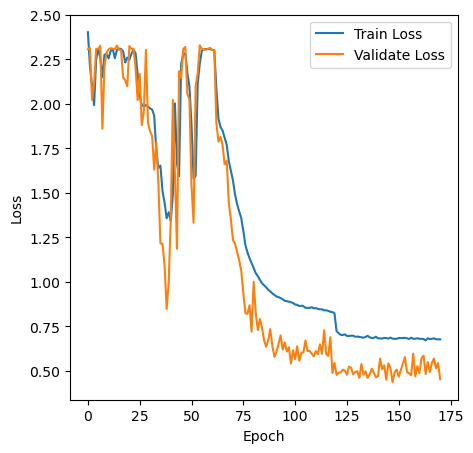

 86%|███████████████████████████████████████████████████████████████▎          | 171/200 [11:09:38<2:07:07, 263.00s/it]

Epoch:171
Time:11:13:48.280702
Loss:0.4821832151696705
Total:10000  Correct:8445  CleanAccuracy:0.8445


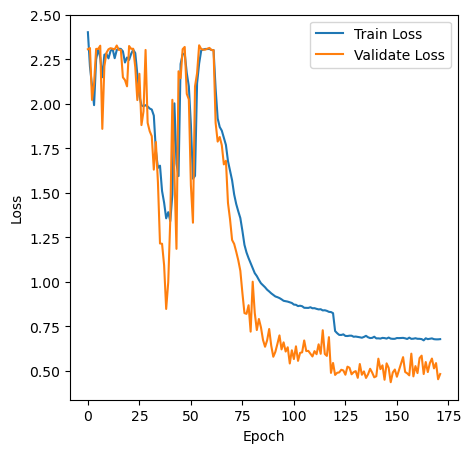

 86%|███████████████████████████████████████████████████████████████▋          | 172/200 [11:13:57<2:02:13, 261.92s/it]

Epoch:172
Time:11:18:05.068682
Loss:0.4997478648068044
Total:10000  Correct:8360  CleanAccuracy:0.8360


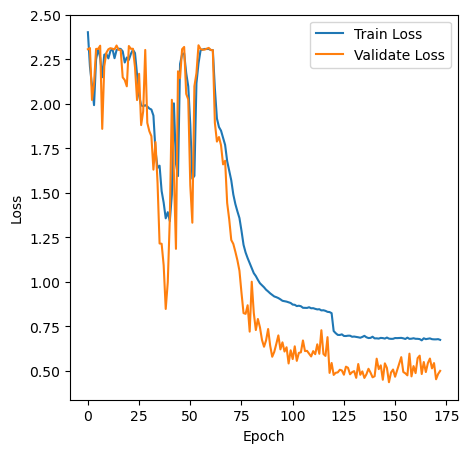

 86%|████████████████████████████████████████████████████████████████          | 173/200 [11:18:14<1:57:09, 260.37s/it]

Epoch:173
Time:11:22:11.595331
Loss:0.5246484824262869
Total:10000  Correct:8267  CleanAccuracy:0.8267


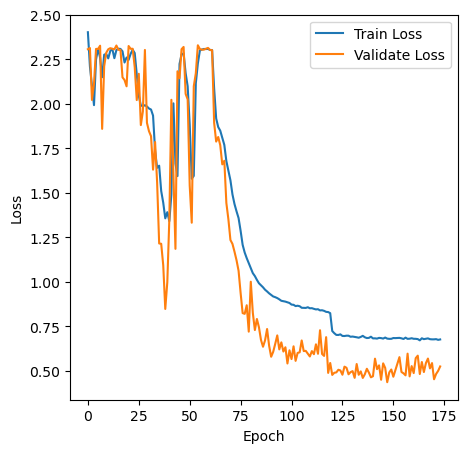

 87%|████████████████████████████████████████████████████████████████▍         | 174/200 [11:22:20<1:50:56, 256.01s/it]

Epoch:174
Time:11:26:17.096799
Loss:0.48172969973315827
Total:10000  Correct:8445  CleanAccuracy:0.8445


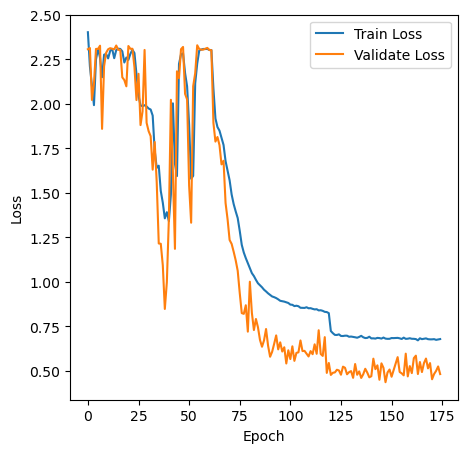

 88%|████████████████████████████████████████████████████████████████▊         | 175/200 [11:26:26<1:45:25, 253.04s/it]

Epoch:175
Time:11:30:22.839610
Loss:0.47993767121062875
Total:10000  Correct:8444  CleanAccuracy:0.8444


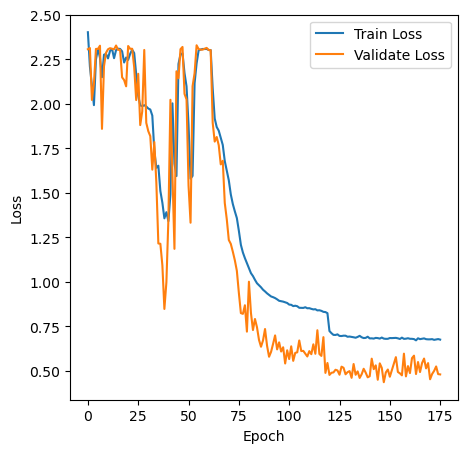

 88%|█████████████████████████████████████████████████████████████████         | 176/200 [11:30:32<1:40:20, 250.87s/it]

Epoch:176
Time:11:34:28.634728
Loss:0.5293686633197644
Total:10000  Correct:8254  CleanAccuracy:0.8254


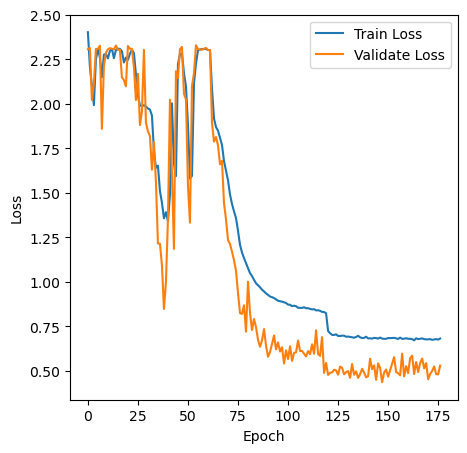

 88%|█████████████████████████████████████████████████████████████████▍        | 177/200 [11:34:38<1:35:34, 249.34s/it]

Epoch:177
Time:11:38:33.970891
Loss:0.45424625827386356
Total:10000  Correct:8520  CleanAccuracy:0.8520


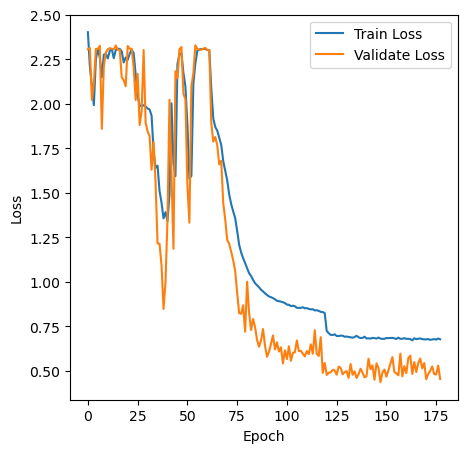

 89%|█████████████████████████████████████████████████████████████████▊        | 178/200 [11:38:43<1:30:58, 248.12s/it]

Epoch:178
Time:11:42:37.495328
Loss:0.5097504341230986
Total:10000  Correct:8374  CleanAccuracy:0.8374


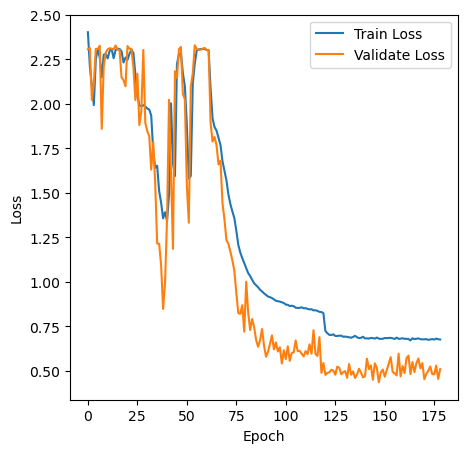

 90%|██████████████████████████████████████████████████████████████████▏       | 179/200 [11:42:46<1:26:21, 246.75s/it]

Epoch:179
Time:11:46:42.435446
Loss:0.4707156072933072
Total:10000  Correct:8494  CleanAccuracy:0.8494


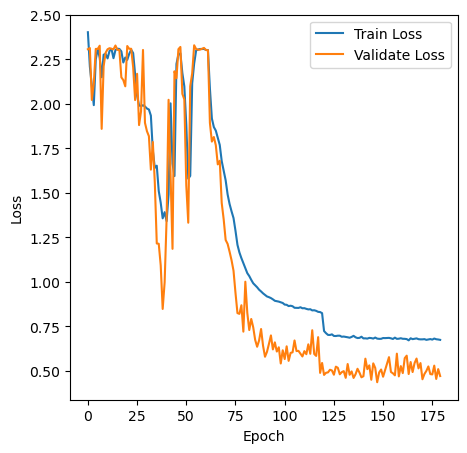

 90%|██████████████████████████████████████████████████████████████████▌       | 180/200 [11:46:51<1:22:03, 246.17s/it]

Epoch:180
Time:11:50:48.492362
Loss:0.473521768047025
Total:10000  Correct:8493  CleanAccuracy:0.8493


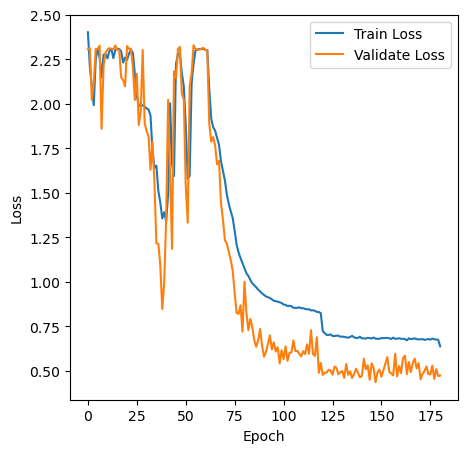

 90%|██████████████████████████████████████████████████████████████████▉       | 181/200 [11:50:57<1:17:57, 246.20s/it]

Epoch:181
Time:11:54:55.442287
Loss:0.4722806420950844
Total:10000  Correct:8497  CleanAccuracy:0.8497


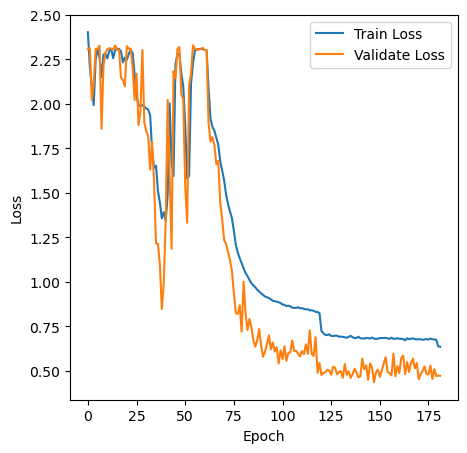

 91%|███████████████████████████████████████████████████████████████████▎      | 182/200 [11:55:04<1:13:54, 246.39s/it]

Epoch:182
Time:11:59:01.390735
Loss:0.476790221878134
Total:10000  Correct:8477  CleanAccuracy:0.8477


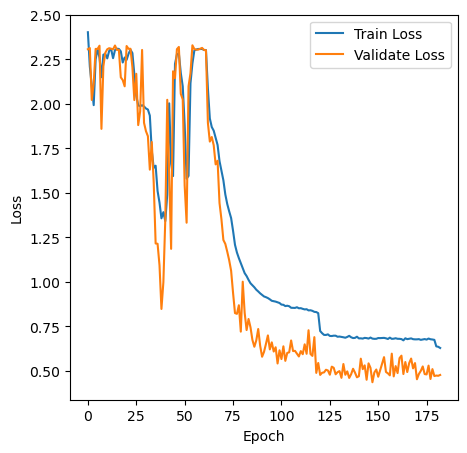

 92%|███████████████████████████████████████████████████████████████████▋      | 183/200 [11:59:10<1:09:46, 246.26s/it]

Epoch:183
Time:12:03:07.920124
Loss:0.495240062522812
Total:10000  Correct:8415  CleanAccuracy:0.8415


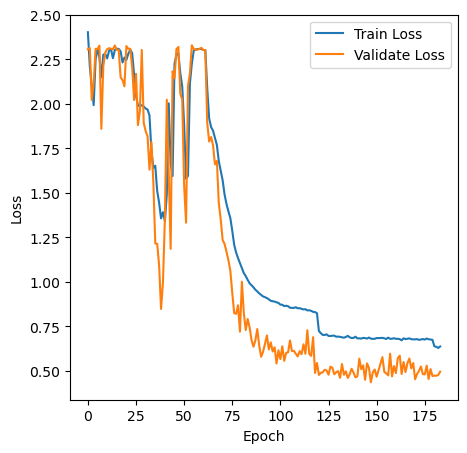

 92%|████████████████████████████████████████████████████████████████████      | 184/200 [12:03:17<1:05:42, 246.41s/it]

Epoch:184
Time:12:07:13.224307
Loss:0.4702744816248409
Total:10000  Correct:8511  CleanAccuracy:0.8511


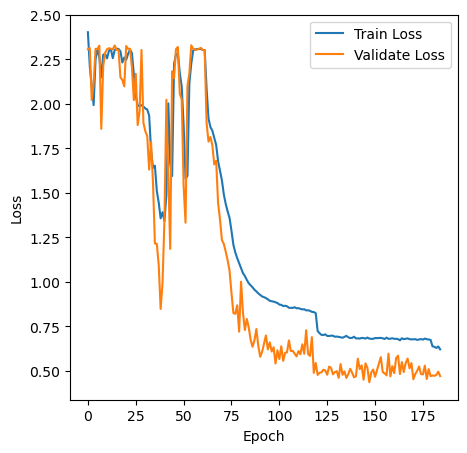

 92%|████████████████████████████████████████████████████████████████████▍     | 185/200 [12:07:22<1:01:29, 245.99s/it]

Epoch:185
Time:12:11:17.812305
Loss:0.46943999315127016
Total:10000  Correct:8474  CleanAccuracy:0.8474


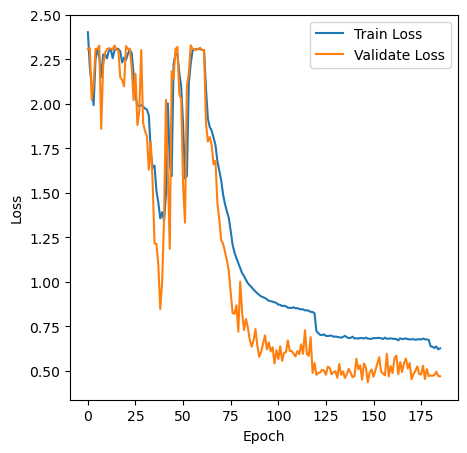

 93%|██████████████████████████████████████████████████████████████████████▋     | 186/200 [12:11:27<57:18, 245.62s/it]

Epoch:186
Time:12:15:23.876055
Loss:0.4677628011415942
Total:10000  Correct:8516  CleanAccuracy:0.8516


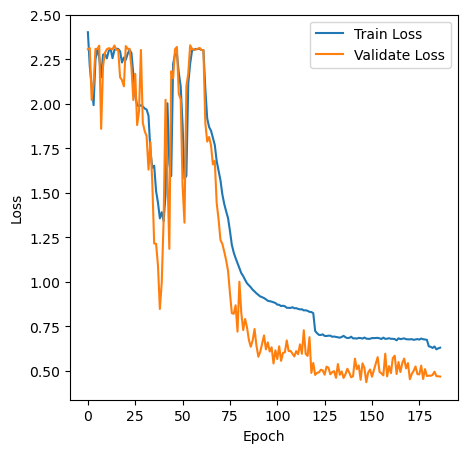

 94%|███████████████████████████████████████████████████████████████████████     | 187/200 [12:15:33<53:15, 245.77s/it]

Epoch:187
Time:12:19:29.646118
Loss:0.5079180931035703
Total:10000  Correct:8367  CleanAccuracy:0.8367


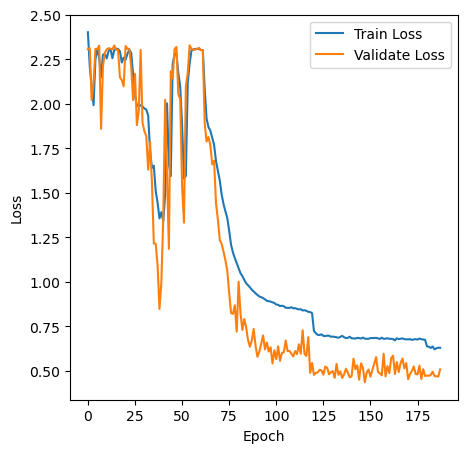

 94%|███████████████████████████████████████████████████████████████████████▍    | 188/200 [12:19:38<49:05, 245.42s/it]

Epoch:188
Time:12:23:19.526394
Loss:0.521442789715319
Total:10000  Correct:8277  CleanAccuracy:0.8277


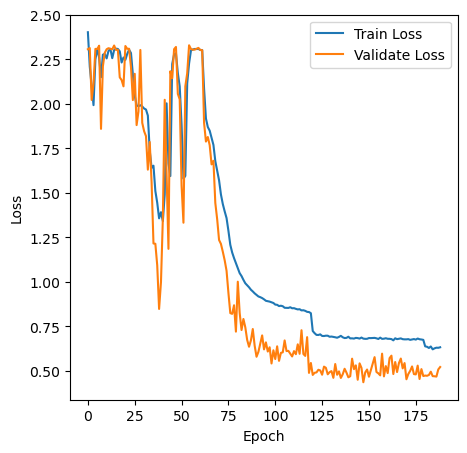

 94%|███████████████████████████████████████████████████████████████████████▊    | 189/200 [12:23:27<44:07, 240.72s/it]

Epoch:189
Time:12:27:07.925305
Loss:0.4655909091472245
Total:10000  Correct:8487  CleanAccuracy:0.8487


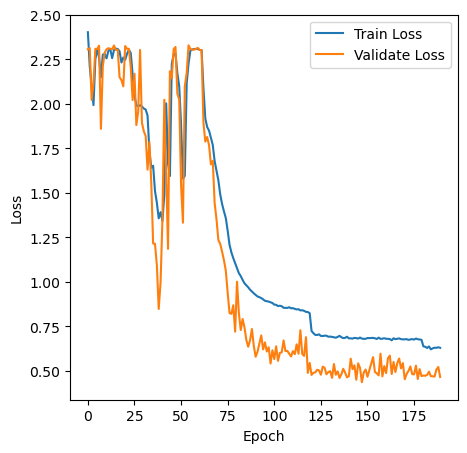

 95%|████████████████████████████████████████████████████████████████████████▏   | 190/200 [12:27:16<39:30, 237.01s/it]

Epoch:190
Time:12:30:56.142416
Loss:0.47637821203127456
Total:10000  Correct:8463  CleanAccuracy:0.8463


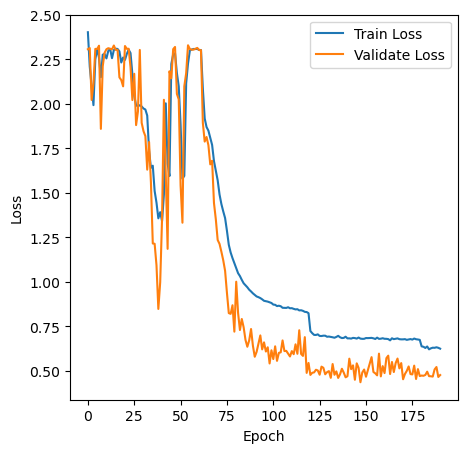

 96%|████████████████████████████████████████████████████████████████████████▌   | 191/200 [12:31:04<35:09, 234.39s/it]

Epoch:191
Time:12:34:45.430127
Loss:0.4680372161653857
Total:10000  Correct:8480  CleanAccuracy:0.8480


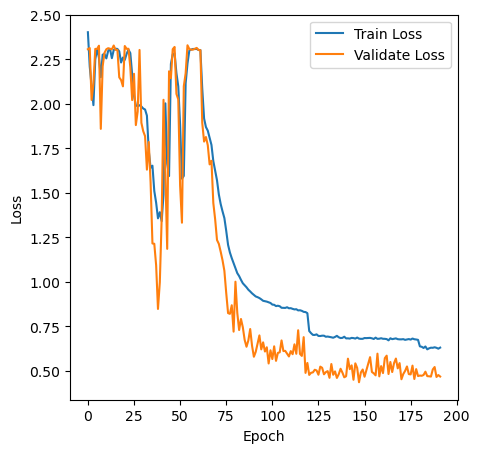

 96%|████████████████████████████████████████████████████████████████████████▉   | 192/200 [12:34:53<31:03, 232.88s/it]

Epoch:192
Time:12:38:34.605108
Loss:0.4820499807691422
Total:10000  Correct:8446  CleanAccuracy:0.8446


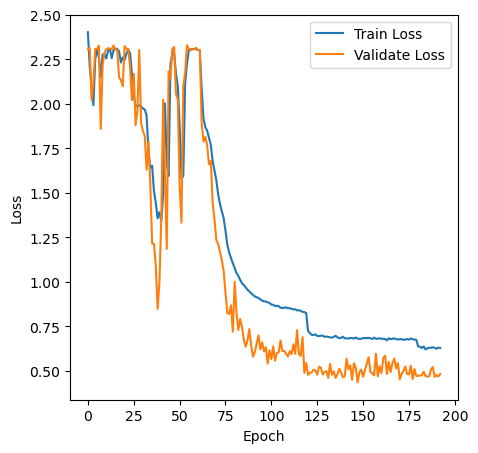

 96%|█████████████████████████████████████████████████████████████████████████▎  | 193/200 [12:38:42<27:02, 231.77s/it]

Epoch:193
Time:12:42:24.441100
Loss:0.5150844386210457
Total:10000  Correct:8370  CleanAccuracy:0.8370


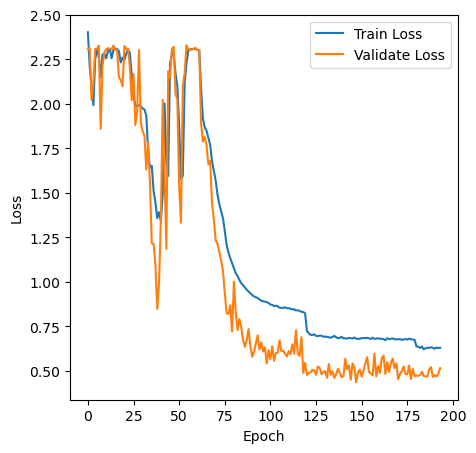

 97%|█████████████████████████████████████████████████████████████████████████▋  | 194/200 [12:42:32<23:07, 231.22s/it]

Epoch:194
Time:12:46:14.475309
Loss:0.4645868885678986
Total:10000  Correct:8535  CleanAccuracy:0.8535


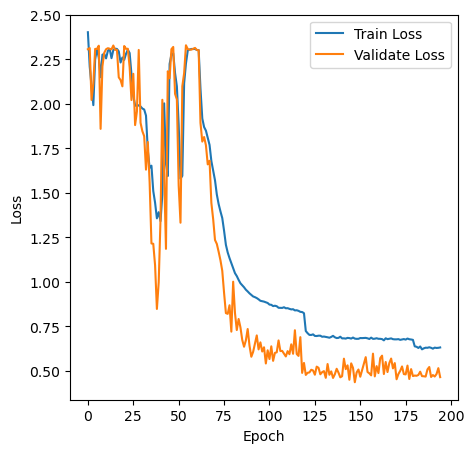

 98%|██████████████████████████████████████████████████████████████████████████  | 195/200 [12:46:22<19:14, 230.81s/it]

Epoch:195
Time:12:50:03.052698
Loss:0.532848471983934
Total:10000  Correct:8290  CleanAccuracy:0.8290


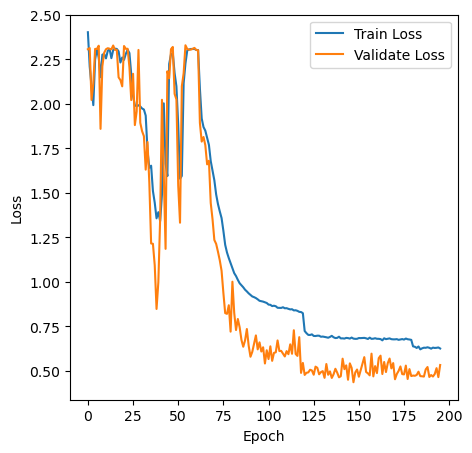

 98%|██████████████████████████████████████████████████████████████████████████▍ | 196/200 [12:50:11<15:20, 230.15s/it]

Epoch:196
Time:12:53:51.802276
Loss:0.49997066346982033
Total:10000  Correct:8395  CleanAccuracy:0.8395


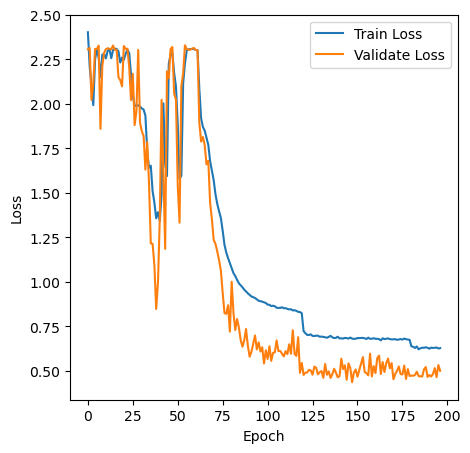

 98%|██████████████████████████████████████████████████████████████████████████▊ | 197/200 [12:53:59<11:29, 229.68s/it]

Epoch:197
Time:12:57:38.921989
Loss:0.47572752578666033
Total:10000  Correct:8474  CleanAccuracy:0.8474


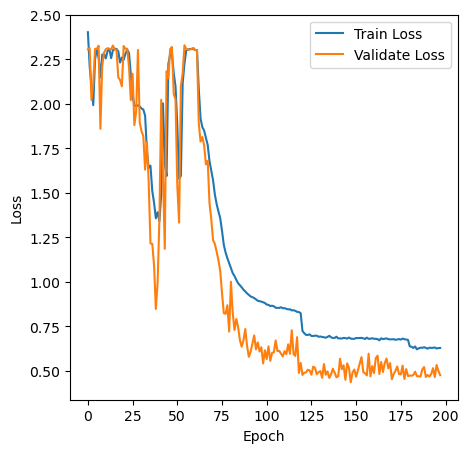

 99%|███████████████████████████████████████████████████████████████████████████▏| 198/200 [12:57:47<07:37, 228.94s/it]

Epoch:198
Time:13:01:24.079884
Loss:0.477730729399969
Total:10000  Correct:8492  CleanAccuracy:0.8492


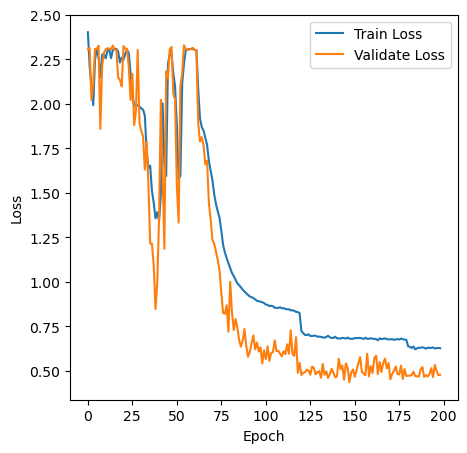

100%|███████████████████████████████████████████████████████████████████████████▌| 199/200 [13:01:32<03:47, 227.78s/it]

Epoch:199
Time:13:05:13.082616
Loss:0.5084277274319158
Total:10000  Correct:8338  CleanAccuracy:0.8338


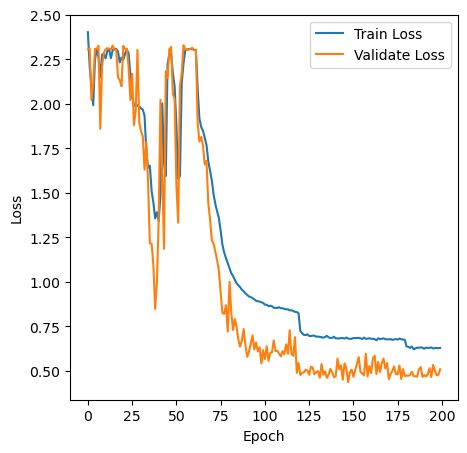

100%|████████████████████████████████████████████████████████████████████████████| 200/200 [13:05:21<00:00, 235.61s/it]


In [9]:
train(model_device=device,
      model=net,
      model_optimizer=optimizer, 
      train_set=train_loader, 
      validate_set=test_loader
)

In [10]:
torch.cuda.empty_cache()